## Epigenetic investigation for immunotherapy related genes
ICR Pathways: GZMA GZMB PRF1 GNLY
HLA molecules HLA-A HLA-B HLA-C HLA-E HLA-F HLA-G HLA-H HLA-DMA HLA-DMB HLA-DOA HLA-DOB HLA-DPA1 HLA-DPB1 HLA-DQA1 HLA-DQA2 HLA-DQB1 HLA-DRA HLA-DRB1
IFN-g pathway genes IFNG IFNGR1 IFNGR2 IRF1 STAT1 PSMB9
chemokines CCR5 CCL3 CCL4 CCL5 CXCL9 CXCL10 CXCL11
adhesion molecules ICAM1 ICAM2 ICAM3 ICAM4 ICAM5 VCAM1

Input genes for cbioportal query:
IFNG IFNGR1 IFNGR2 IRF1 STAT1 PSMB9 ICAM1 ICAM2 ICAM3 ICAM4 ICAM5 VCAM1 CCR5 CCL3 CCL4 CCL5 CXCL9 CXCL10 CXCL11 GZMA GZMB PRF1 GNLY HLA-A HLA-B HLA-C HLA-E HLA-F HLA-G HLA-H HLA-DMA HLA-DMB HLA-DOA HLA-DOB HLA-DPA1 HLA-DPB1 HLA-DQA1 HLA-DQA2 HLA-DQB1 HLA-DRA HLA-DRB1 (41 genes)
Case query: Skin cancer(melanoma) from TCGA provision (471 cases)

In [17]:
# data source: http://www.cbioportal.org/index.do?session_id=59dbf8f6498e5df2e29663ab&show_samples=false&clinicallist=NO_CONTEXT_MUTATION_SIGNATURE,AJCC_TUMOR_PATHOLOGIC_PT,ICD_10&
# filename ifng
import pandas as pd
import numpy as np
import random
import math
%matplotlib inline
#%matplotlib notebook
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np

## Exploratory: check HLA-B mRNA expression vs IFNG methylation

In [18]:
data = pd.read_table('./plots-hlab-ifng.txt', index_col=False)
data.shape

(471, 4)

In [19]:
data.head(5)

,Sample Id,"IFNG, Methylation (HM450)","HLA-B, mRNA expression (RNA Seq V2 RSEM)",Mutations
0,TCGA-YD-A9TB-06,0.328013,57170.5428,NaN
1,TCGA-XV-AAZY-01,0.444676,69591.2139,NaN
2,TCGA-XV-AAZW-01,0.757459,9246.8939,NaN
3,TCGA-XV-AAZV-01,0.627704,131417.7147,NaN
4,TCGA-W3-AA1V-06,0.622964,65417.2806,NaN


In [20]:
mask = data['Mutations'].isnull()
single = (data['Mutations'].str.count(':') == 1)
mut = data[~mask & single]
mut.shape

(10, 4)

### Check Pearson and Spearman correlation coefficient 
### threshold at > 0.5 or < -0.5 to say it is significant
### for mutated genes, HLA-B mRNA expression is significantly correlated with IFNG methylation

In [21]:
mut.corr(method='pearson')

,"IFNG, Methylation (HM450)","HLA-B, mRNA expression (RNA Seq V2 RSEM)"
"IFNG, Methylation (HM450)",1.000000,0.642069
"HLA-B, mRNA expression (RNA Seq V2 RSEM)",0.642069,1.000000


In [22]:
mut.corr(method='spearman')

,"IFNG, Methylation (HM450)","HLA-B, mRNA expression (RNA Seq V2 RSEM)"
"IFNG, Methylation (HM450)",1.000000,0.951515
"HLA-B, mRNA expression (RNA Seq V2 RSEM)",0.951515,1.000000


## Plot best fit lines of data and mutated genes
## Also show spearman and pearson correlation

In [23]:
# plot best fit line & scatter plot
# add spearman and pearson correlation coeff
def methplotXY (df, axis, log, label, scatter, corr, color) :
    X = df.iloc[:,1]
    if (log) :
        Y = df.iloc[:,2].apply(np.log)
    else :
        Y = df.iloc[:,2]
    # best fit line for df
    z = np.polyfit(X, Y, deg=1)
    p = np.poly1d(z)

    if (scatter) :
        axis.scatter(X, Y, label="", color=color)
    if (corr) :
        Scorr = df.corr(method='pearson').iloc[0,1]
        Pcorr = df.corr(method='spearman').iloc[0,1]
        label = label+'(fit)'+"\ns:%.3f"%(Scorr,) + "\np:%.3f"%(Pcorr,)

    _ = plt.plot(X, p(X), '-'+color, label=label)
    
# plot best fit lines for df and mut using
# col 2(numerical or log) vs col 1 with title
def methplot(df, mut, log, scatter, title) :
    fig, axis = plt.subplots()
    # Grid lines, Xticks, Xlabel, Ylabel
    axis.yaxis.grid(True)
    axis.set_title(title,fontsize=10)
    axis.set_xlabel(mut.columns.values[1],fontsize=10)
    if (log) :
        axis.set_ylabel(mut.columns.values[2]+'(log)',fontsize=10)
    else :
        axis.set_ylabel(mut.columns.values[2],fontsize=10)

    # best fit line and corr for df    
    methplotXY(df, axis, log, "Data", scatter, 1, 'b')
    
    # scatter plot, best fit line, corr for mut
    methplotXY(mut, axis, log, "Mut", 1, 1,'r')
    
    # set legend values
    plt.legend(loc='best')
    plt.show()

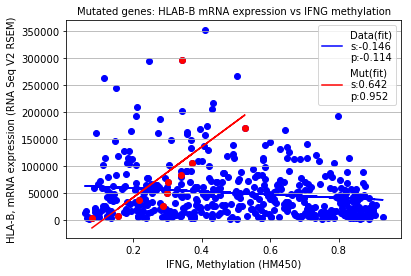

In [24]:
methplot(data, mut, 0, 1, 'Mutated genes: HLAB-B mRNA expression vs IFNG methylation')

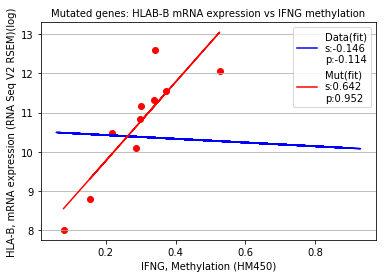

In [25]:
methplot(data, mut, 1, 0, 'Mutated genes: HLAB-B mRNA expression vs IFNG methylation')

## Example for plotting confidence intervals 

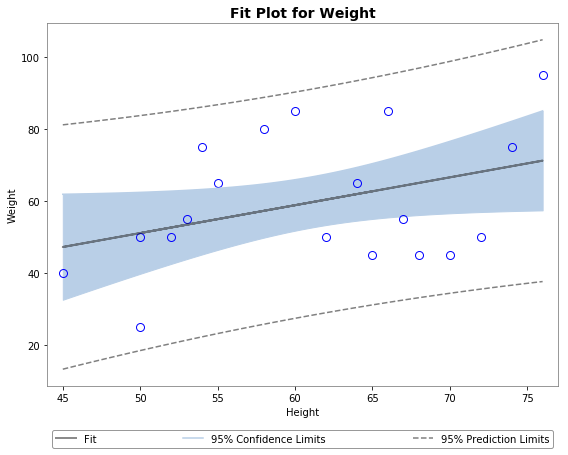

In [26]:
# Example plot for showing conf intervals and prediction intervals
# z, residuals, rank, singular_values, rcond = np.polyfit(x, y, 1, full=True)
# residuals then is the sum of least squares.

# z, cov = np.polyfit(x, y, 1, cov=True)
# diagonal elements of cov are the variances of the coefficients in z, 
# i.e. np.sqrt(np.diag(cov)) gives you the standard deviations of the coefficients

# import seaborn as sns
# heights = np.array([50,52,53,54,58,60,62,64,66,67, 68,70,72,74,76,55,50,45,65])
# weights = np.array([25,50,55,75,80,85,50,65,85,55,45,45,50,75,95,65,50,40,45])
# sns.regplot(heights,weights, color ='blue')
#------------------------------------------------------------------------------
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np

# Data
heights = np.array([50,52,53,54,58,60,62,64,66,67,68,70,72,74,76,55,50,45,65])
weights = np.array([25,50,55,75,80,85,50,65,85,55,45,45,50,75,95,65,50,40,45])

x = heights
y = weights

# Modeling with Numpy
p, cov = np.polyfit(x, y, 1, cov=True)        # parameters and covariance from of the fit
y_model = np.polyval(p, x)                    # model using the fit parameters; NOTE: parameters here are coefficients

# Statistics
n = weights.size                              # number of observations
m = p.size                                    # number of parameters
DF = n - m                                    # degrees of freedom
t = stats.t.ppf(0.95, n - m)                  # used for CI and PI bands

# Estimates of Error in Data/Model
resid = y - y_model                           
chi2 = np.sum((resid/y_model)**2)             # chi-squared; estimates error in data
chi2_red = chi2/(DF)                          # reduced chi-squared; measures goodness of fit
s_err = np.sqrt(np.sum(resid**2)/(DF))        # standard deviation of the error


# Plotting --------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(8,6))

# Data
ax.plot(x, y, 'o', color='#b9cfe7', markersize=8,
        markeredgewidth=1, markeredgecolor='b', markerfacecolor='None')

# Fit
ax.plot(x, y_model, '-', color='0.1', linewidth='2', alpha=0.5, label='Fit')  

x2 = np.linspace(np.min(x), np.max(x), 100)
y2 = np.linspace(np.min(y_model), np.max(y_model), 100)

# Confidence Interval
CI = t*s_err*np.sqrt(1/n +(x2-np.mean(x))**2/np.sum((x-np.mean(x))**2))
ax.fill_between(x2, y2+CI, y2-CI, color='#b9cfe7', edgecolor='')

'''Minor hack for labeling CI fill_between()'''
ax.plot(x2, y2+CI, '-', color='#b9cfe7', label='95% Confidence Limits')

# Prediction Interval
PI = t*s_err*np.sqrt(1+1/n+(x2-np.mean(x))**2/np.sum((x-np.mean(x))**2))   
ax.fill_between(x2, y2+PI, y2-PI, color='None', linestyle='--')
ax.plot(x2, y2-PI, '--', color='0.5', label='95% Prediction Limits')
ax.plot(x2, y2+PI, '--', color='0.5')


# Figure Modifications --------------------------------------------------------
# Borders
ax.spines['top'].set_color('0.5')
ax.spines['bottom'].set_color('0.5')
ax.spines['left'].set_color('0.5')
ax.spines['right'].set_color('0.5')
ax.get_xaxis().set_tick_params(direction='out')
ax.get_yaxis().set_tick_params(direction='out')
ax.xaxis.tick_bottom()
ax.yaxis.tick_left() 

# Labels
plt.title('Fit Plot for Weight', fontsize='14', fontweight='bold')
plt.xlabel('Height')
plt.ylabel('Weight')
legend = plt.legend(loc=9, bbox_to_anchor=(0, -0.21, 1., .102), ncol=3, mode='expand')
frame = legend.get_frame().set_edgecolor('0.5')
plt.xlim(np.min(x)-1, np.max(x)+1)

# Save Figure
plt.tight_layout()

## Plot mRNA expression vs methylation 
Criteria is pearson and spearman correlation are significant.
Significant is either > 0.5 or < -0.5.
Also selecting cases where there are at least 5 cases of mutations

In [27]:
def mutReadPlot(file, title) :
    data = pd.read_table(file, index_col=False)
    mask = data['Mutations'].isnull()
    single = (data['Mutations'].str.count(':') == 1)
    mut = data[~mask & single]
    methplot(data, mut, 0, 1, title)
    methplot(data, mut, 1, 0, title)

## Plot mRNA expression vs methylation with confidence and prediction intervals

In [28]:
# plot best fit line & scatter plot & 95% conf intervals
# add spearman and pearson correlation coeff
def CIplotXY (df, axis, log, label, scatter, corr, mark, color, CIcolor) :
    if (log) :
        zr = df.iloc[:,2] == 0
        df = df[~zr]

    X = df.iloc[:,1]
    if (log) :
        Y = df.iloc[:,2].apply(np.log)
    else :
        Y = df.iloc[:,2]
    # best fit line for df
    z, cov = np.polyfit(X, Y, deg=1, cov=True)
    p = np.poly1d(z)
    
    y_model = np.polyval(z, X)  # model using the fit parameters; NOTE: parameters here are coefficients

    # Statistics
    n = Y.size    # number of observations
    m = z.size    # number of parameters
    DF = n - m    # degrees of freedom
    t = stats.t.ppf(0.95, n - m)    # used for CI and PI bands
    
    # Estimates of Error in Data/Model
    resid = Y - y_model                           
    chi2 = np.sum((resid/y_model)**2)   # chi-squared; estimates error in data
    chi2_red = chi2/(DF)                # reduced chi-squared; measures goodness of fit
    s_err = np.sqrt(np.sum(resid**2)/(DF))  # standard deviation of the error

    x2 = np.linspace(np.min(X), np.max(X), 100)
    y2 = np.linspace(np.max(y_model), np.min(y_model), 100)

    # Prediction Interval
    PI = t*s_err*np.sqrt(1+1/n+(x2-np.mean(X))**2/np.sum((X-np.mean(X))**2))   
    #axis.fill_between(x2, y2+PI, y2-PI, color='#f7f307', alpha='0.2', linestyle='--')
    axis.fill_between(x2, y2+PI, y2-PI, color=CIcolor, alpha='0.2', linestyle='--')
    axis.plot(x2, y2-PI, '--', color=CIcolor, label='95% Pred')
    axis.plot(x2, y2+PI, '--', color=CIcolor)

    # Confidence Interval
    CI = t*s_err*np.sqrt(1/n +(x2-np.mean(X))**2/np.sum((X-np.mean(X))**2))
    axis.fill_between(x2, y2+CI, y2-CI, color=CIcolor, edgecolor='')

    #'''Minor hack for labeling CI fill_between()'''
    axis.plot(x2, y2+CI, '-', color=CIcolor, label='95% Conf')
    
    if (scatter) :
        axis.scatter(X, Y, marker=mark, label="", color=color)
    if (corr) :
        Scorr = df.corr(method='pearson').iloc[0,1]
        Pcorr = df.corr(method='spearman').iloc[0,1]
        label = label+'(fit)'+"\ns:%.3f"%(Scorr,) + "\np:%.3f"%(Pcorr,)

    _ = plt.plot(X, p(X), '-'+color, label=label)


# plot best fit lines for df and mut using
# col 2(numerical or log) vs col 1 with title
def CIplot(df, mut, log, scatter, title) :
    fig, axis = plt.subplots()
    # Grid lines, Xticks, Xlabel, Ylabel
    axis.yaxis.grid(True)
    axis.set_title(title,fontsize=10)
    axis.set_xlabel(mut.columns.values[1],fontsize=10)
    if (log) :
        axis.set_ylabel(mut.columns.values[2]+'(log)',fontsize=10)
    else :
        axis.set_ylabel(mut.columns.values[2],fontsize=10)

    # scatter plot, best fit line, corr for mut
    CIplotXY(mut, axis, log, "Mut", 1, 1, 'o', 'r', '#f2ab9d')

    # best fit line and corr for df    
    CIplotXY(df, axis, log, "Data", scatter, 1, '.', 'b', '#b9cfe7')  
    
    # set legend values
    plt.legend(loc='best')
    plt.show()

def CIReadPlot(file, title) :
    data = pd.read_table(file, index_col=False)
    mask = data['Mutations'].isnull()
    single = (data['Mutations'].str.count(':') == 1)
    mut = data[~mask & single]
    CIplot(data, mut, 0, 1, title)
    CIplot(data, mut, 1, 0, title)

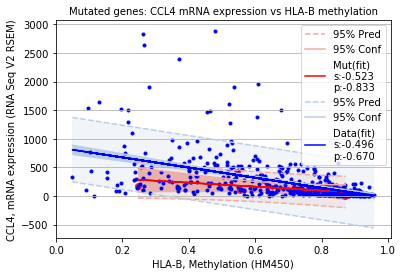

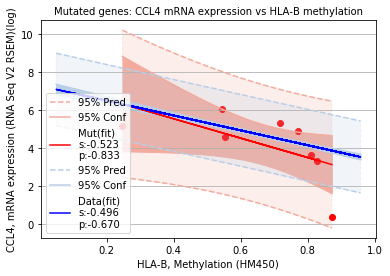

In [29]:
CIReadPlot('./plots-ccl4-hlab.txt', 'Mutated genes: CCL4 mRNA expression vs HLA-B methylation')

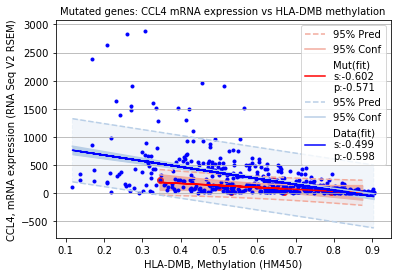

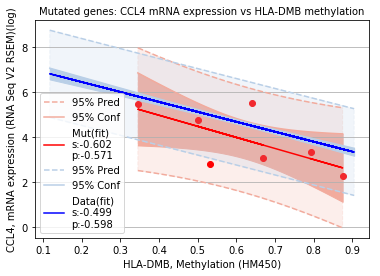

In [30]:
CIReadPlot('./plots-ccl4-hladmb.txt', 'Mutated genes: CCL4 mRNA expression vs HLA-DMB methylation')

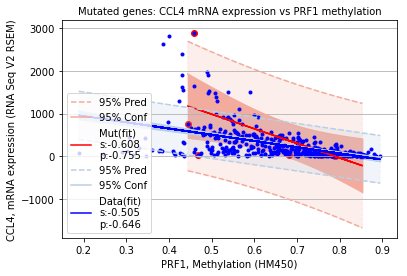

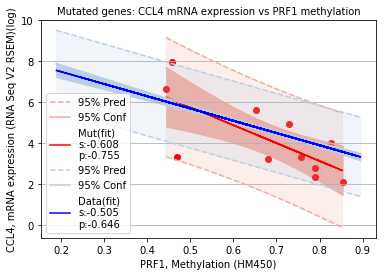

In [31]:
CIReadPlot('./plots-ccl4-prf1.txt', 'Mutated genes: CCL4 mRNA expression vs PRF1 methylation')

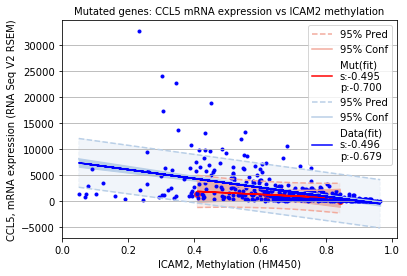

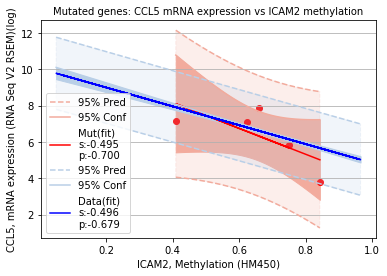

In [32]:
CIReadPlot('./plots-ccl5-icam2.txt', 'Mutated genes: CCL5 mRNA expression vs ICAM2 methylation')

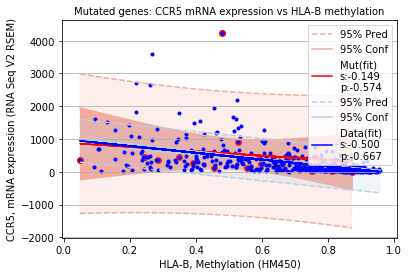

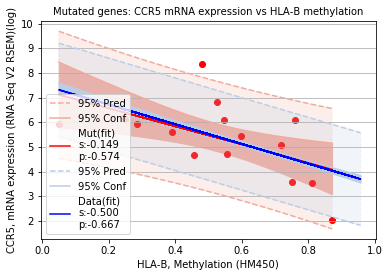

In [33]:
CIReadPlot('./plots-ccr5-hlab.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-B methylation')

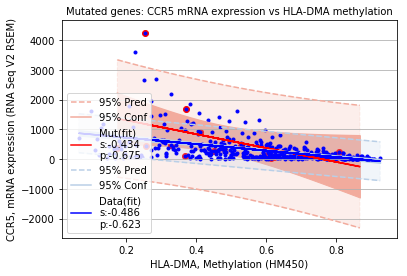

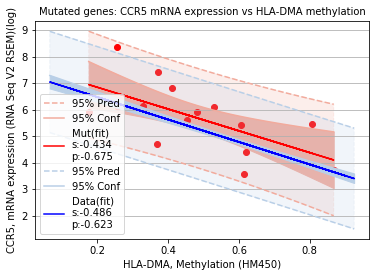

In [34]:
CIReadPlot('./plots-ccr5-hladma.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-DMA methylation')

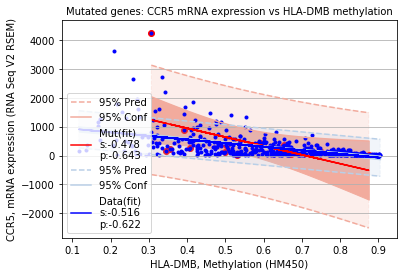

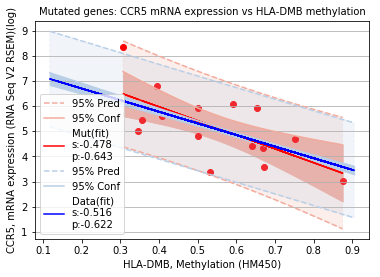

In [35]:
CIReadPlot('./plots-ccr5-hladmb.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-DMB methylation')

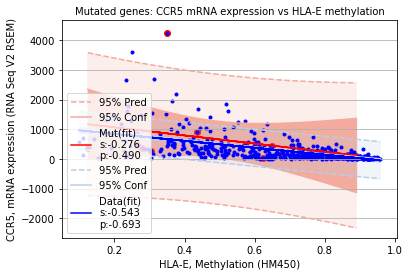

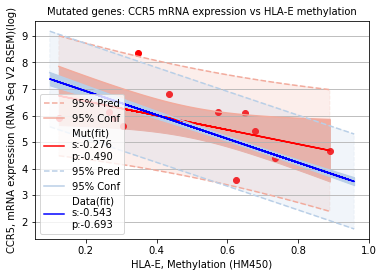

In [36]:
CIReadPlot('./plots-ccr5-hlae.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-E methylation')

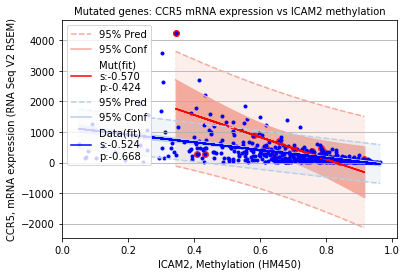

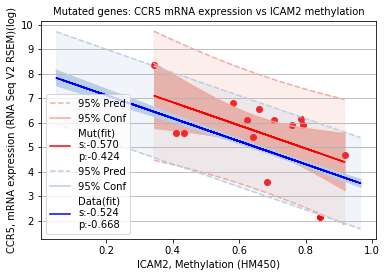

In [37]:
CIReadPlot('./plots-ccr5-icam2.txt', 'Mutated genes: CCR5 mRNA expression vs ICAM2 methylation')

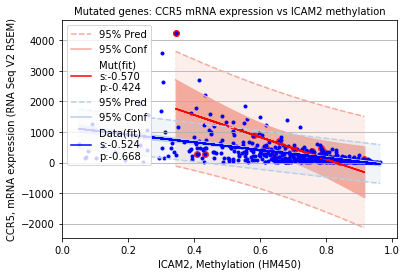

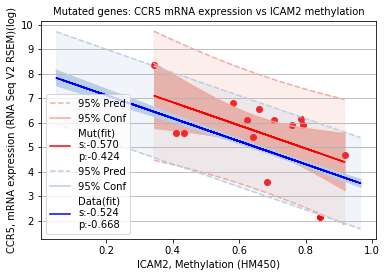

In [38]:
CIReadPlot('./plots-ccr5-icam2.txt', 'Mutated genes: CCR5 mRNA expression vs ICAM2 methylation')

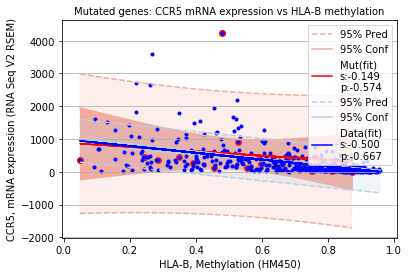

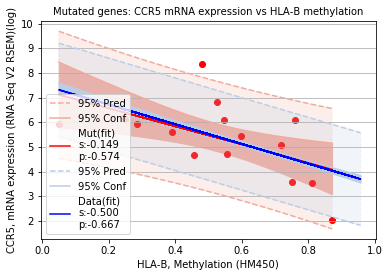

In [39]:
CIReadPlot('./plots-ccr5-hlab.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-B methylation')

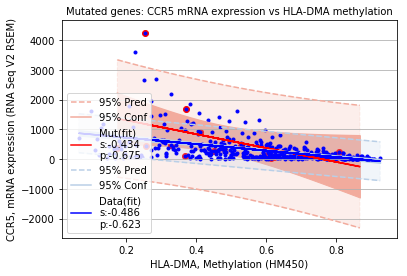

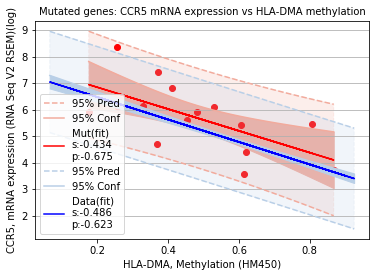

In [40]:
CIReadPlot('./plots-ccr5-hladma.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-DMA methylation')

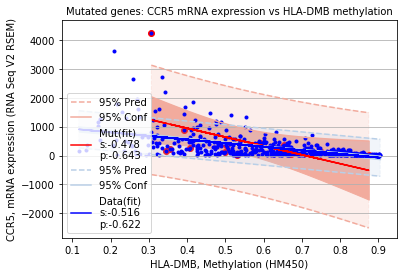

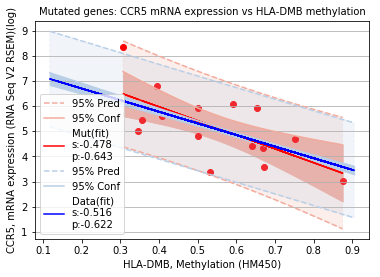

In [41]:
CIReadPlot('./plots-ccr5-hladmb.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-DMB methylation')

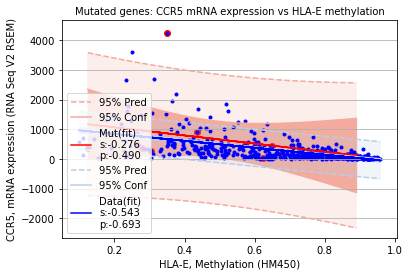

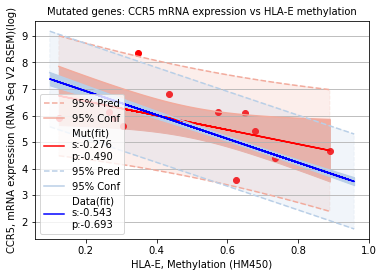

In [42]:
CIReadPlot('./plots-ccr5-hlae.txt', 'Mutated genes: CCR5 mRNA expression vs HLA-E methylation')

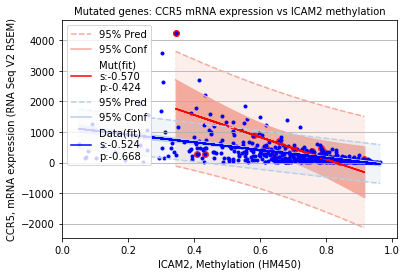

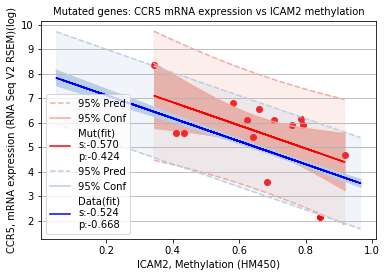

In [43]:
CIReadPlot('./plots-ccr5-icam2.txt', 'Mutated genes: CCR5 mRNA expression vs ICAM2 methylation')

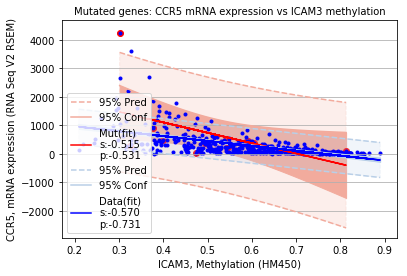

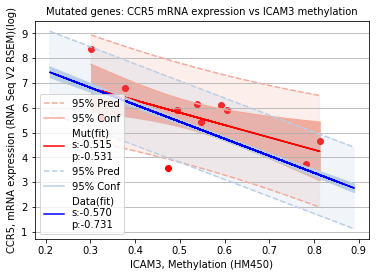

In [44]:
CIReadPlot('./plots-ccr5-icam3.txt', 'Mutated genes: CCR5 mRNA expression vs ICAM3 methylation')

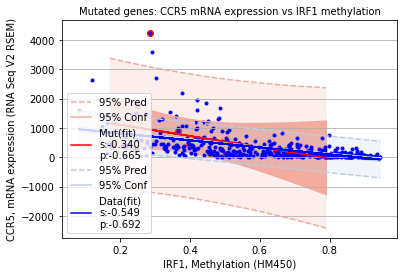

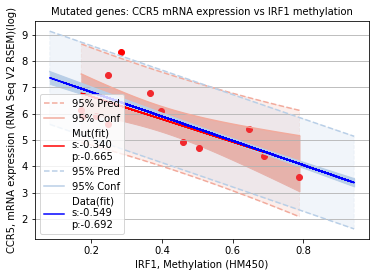

In [45]:
CIReadPlot('./plots-ccr5-irf1.txt', 'Mutated genes: CCR5 mRNA expression vs IRF1 methylation')

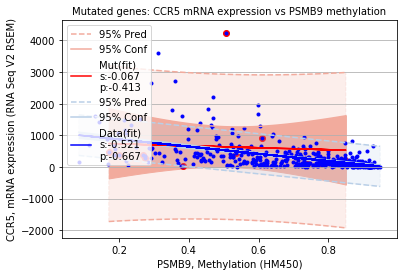

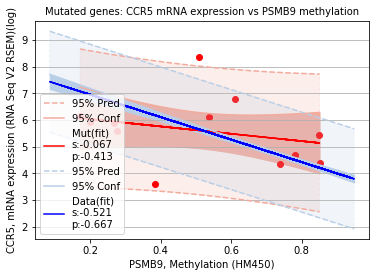

In [46]:
CIReadPlot('./plots-ccr5-psmb9.txt', 'Mutated genes: CCR5 mRNA expression vs PSMB9 methylation')

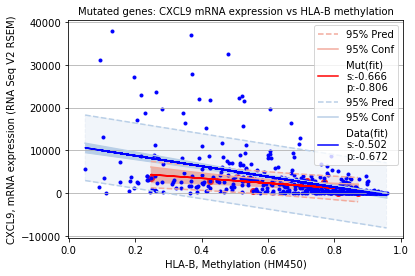

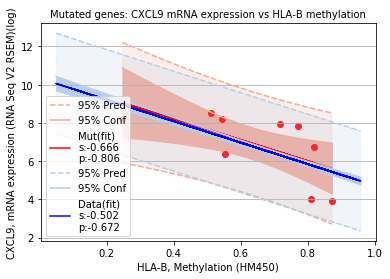

In [47]:
CIReadPlot('./plots-cxcl9-hlab.txt', 'Mutated genes: CXCL9 mRNA expression vs HLA-B methylation')

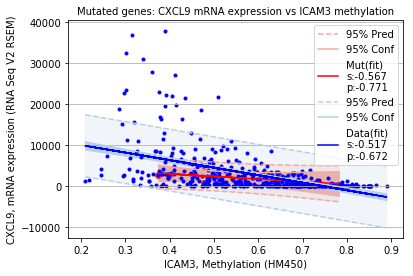

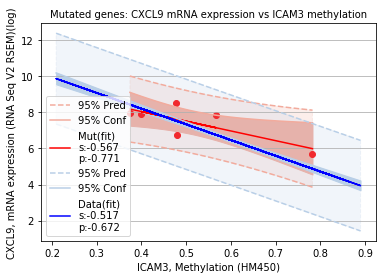

In [48]:
CIReadPlot('./plots-cxcl9-icam3.txt', 'Mutated genes: CXCL9 mRNA expression vs ICAM3 methylation')

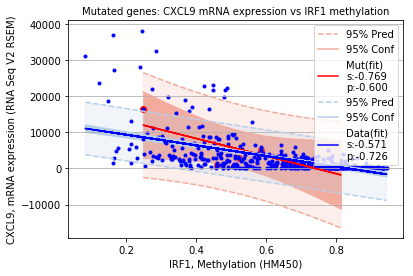

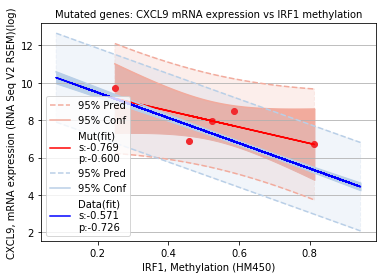

In [49]:
CIReadPlot('./plots-cxcl9-irf1.txt', 'Mutated genes: CXCL9 mRNA expression vs IRF1 methylation')

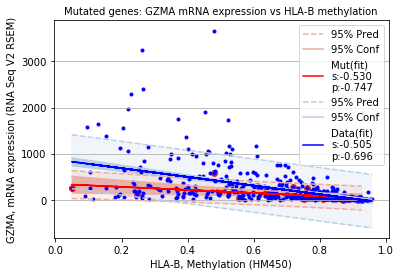

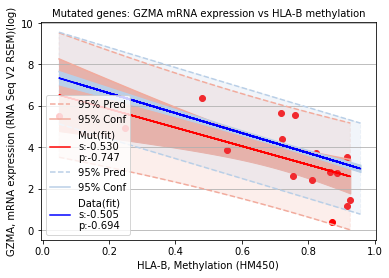

In [50]:
CIReadPlot('./plots-gzma-hlab.txt', 'Mutated genes: GZMA mRNA expression vs HLA-B methylation')

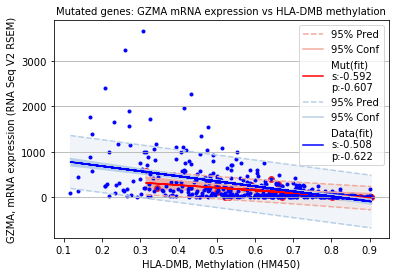

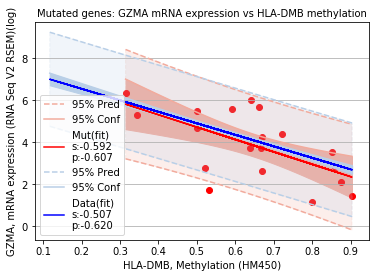

In [51]:
CIReadPlot('./plots-gzma-hladmb.txt', 'Mutated genes: GZMA mRNA expression vs HLA-DMB methylation')

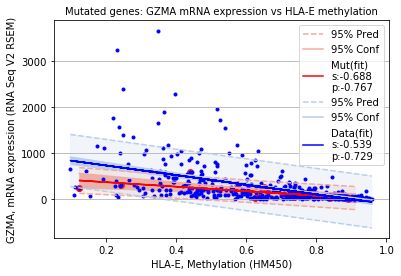

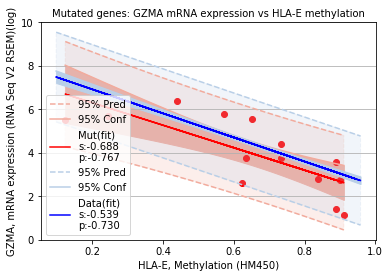

In [52]:
CIReadPlot('./plots-gzma-hlae.txt', 'Mutated genes: GZMA mRNA expression vs HLA-E methylation')

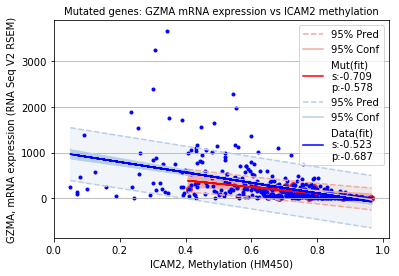

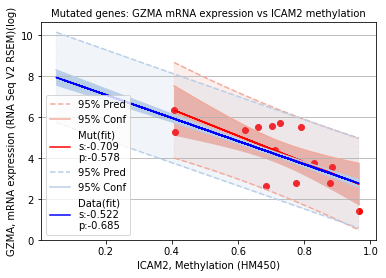

In [53]:
CIReadPlot('./plots-gzma-icam2.txt', 'Mutated genes: GZMA mRNA expression vs ICAM2 methylation')

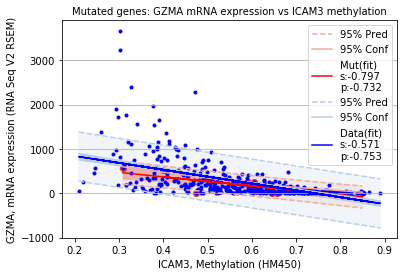

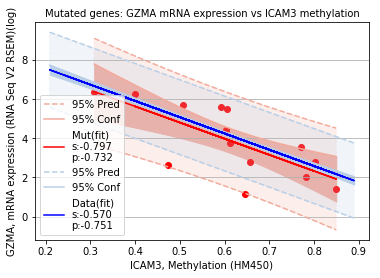

In [54]:
CIReadPlot('./plots-gzma-icam3.txt', 'Mutated genes: GZMA mRNA expression vs ICAM3 methylation')

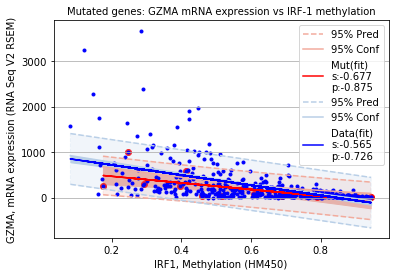

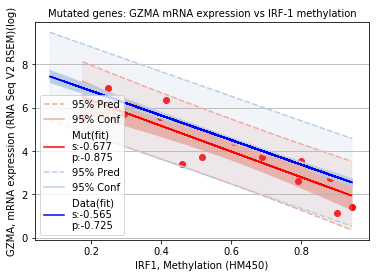

In [55]:
CIReadPlot('./plots-gzma-irf1.txt', 'Mutated genes: GZMA mRNA expression vs IRF-1 methylation')

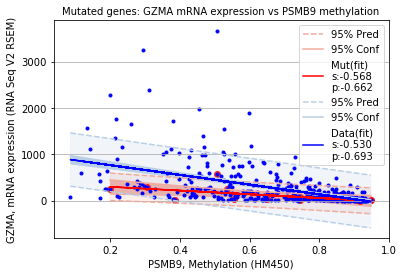

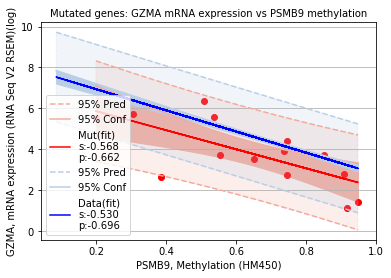

In [56]:
CIReadPlot('./plots-gzma-psmb9.txt', 'Mutated genes: GZMA mRNA expression vs PSMB9 methylation')

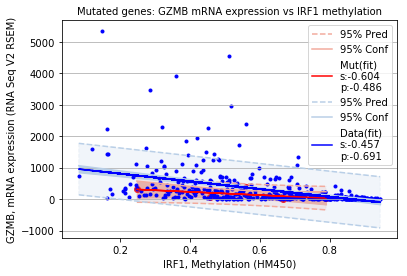

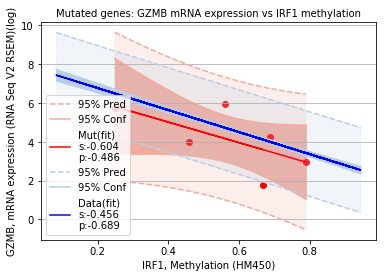

In [57]:
CIReadPlot('./plots-gzmb-irf1.txt', 'Mutated genes: GZMB mRNA expression vs IRF1 methylation')

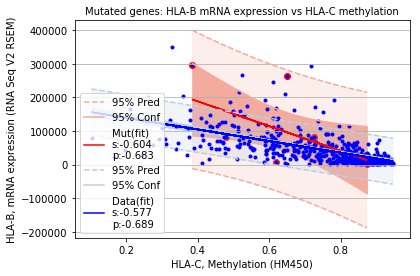

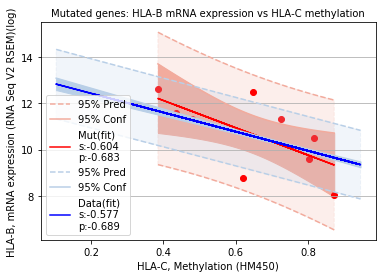

In [58]:
CIReadPlot('./plots-hlab-hlac.txt', 'Mutated genes: HLA-B mRNA expression vs HLA-C methylation')

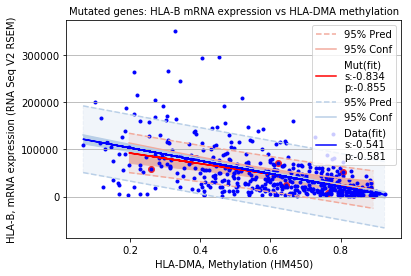

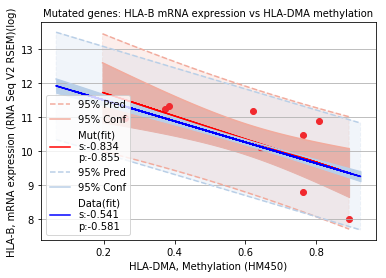

In [59]:
CIReadPlot('./plots-hlab-hladma.txt', 'Mutated genes: HLA-B mRNA expression vs HLA-DMA methylation')

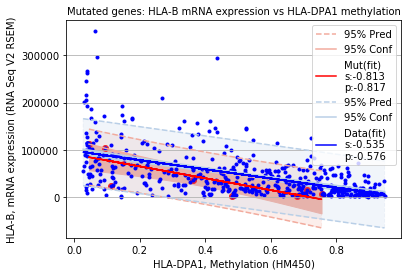

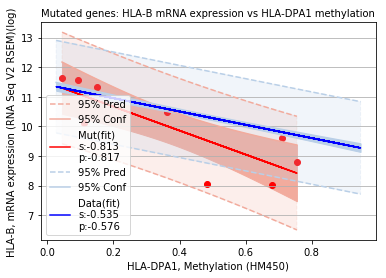

In [60]:
CIReadPlot('./plots-hlab-hladpa1.txt', 'Mutated genes: HLA-B mRNA expression vs HLA-DPA1 methylation')

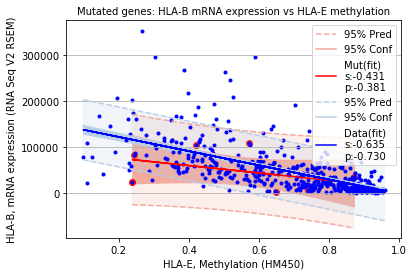

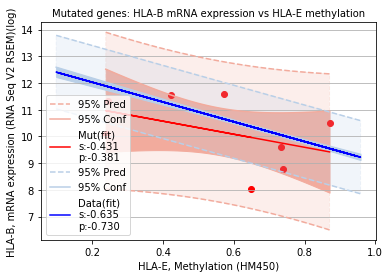

In [61]:
CIReadPlot('./plots-hlab-hlae.txt', 'Mutated genes: HLA-B mRNA expression vs HLA-E methylation')

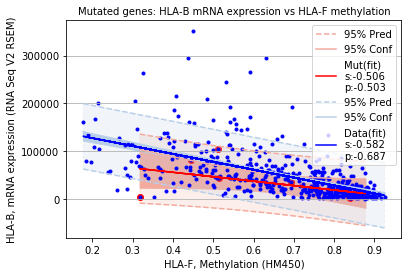

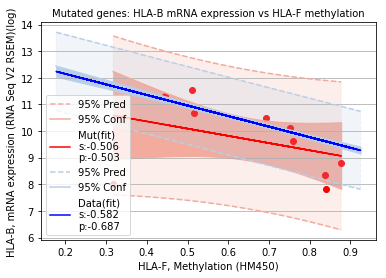

In [62]:
CIReadPlot('./plots-hlab-hlaf.txt', 'Mutated genes: HLA-B mRNA expression vs HLA-F methylation')

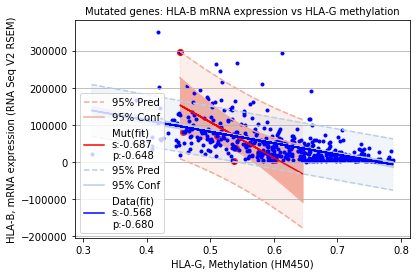

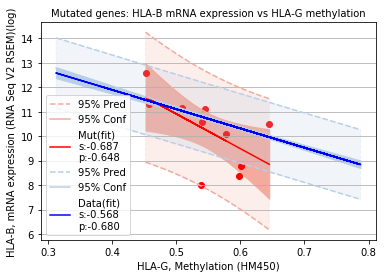

In [63]:
CIReadPlot('./plots-hlab-hlag.txt', 'Mutated genes: HLA-B mRNA expression vs HLA-G methylation')

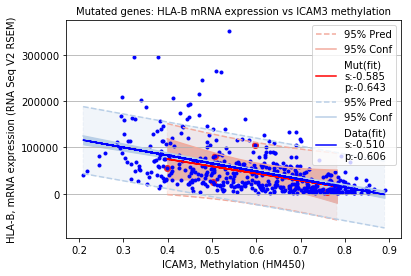

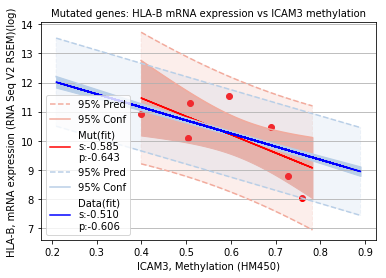

In [64]:
CIReadPlot('./plots-hlab-icam3.txt', 'Mutated genes: HLA-B mRNA expression vs ICAM3 methylation')

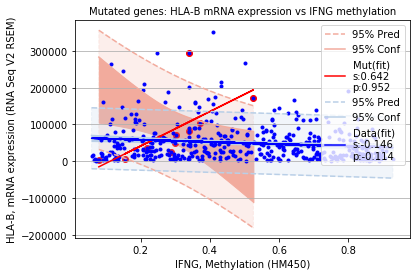

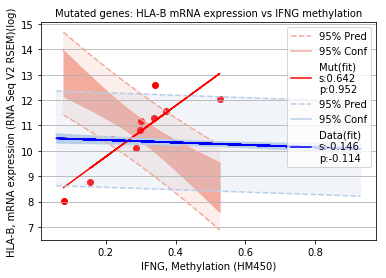

In [65]:
CIReadPlot('./plots-hlab-ifng.txt', 'Mutated genes: HLA-B mRNA expression vs IFNG methylation')

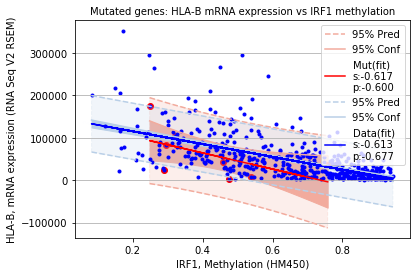

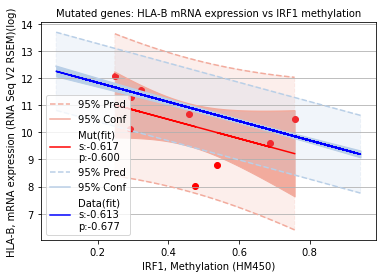

In [66]:
CIReadPlot('./plots-hlab-irf1.txt', 'Mutated genes: HLA-B mRNA expression vs IRF1 methylation')

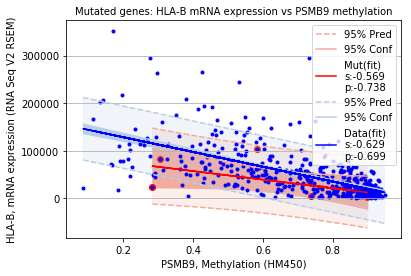

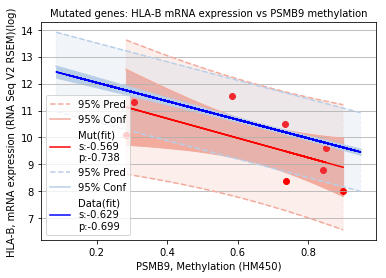

In [67]:
CIReadPlot('./plots-hlab-psmb9.txt', 'Mutated genes: HLA-B mRNA expression vs PSMB9 methylation')

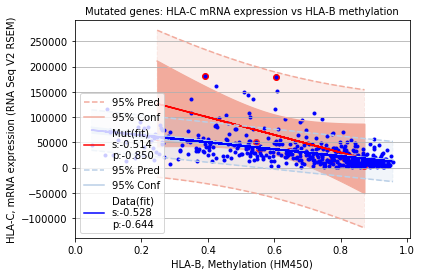

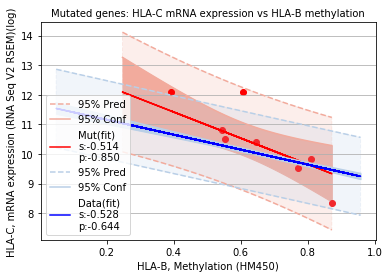

In [68]:
CIReadPlot('./plots-hlac-hlab.txt', 'Mutated genes: HLA-C mRNA expression vs HLA-B methylation')

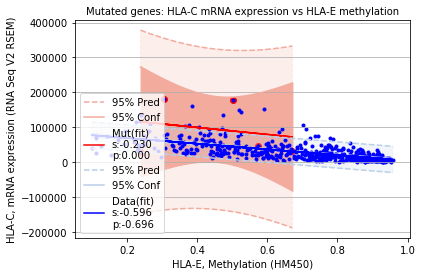

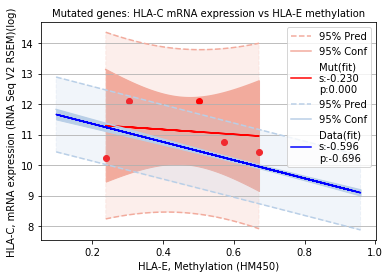

In [69]:
CIReadPlot('./plots-hlac-hlae.txt', 'Mutated genes: HLA-C mRNA expression vs HLA-E methylation')

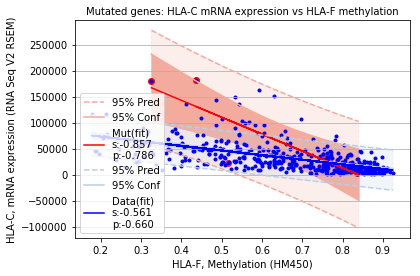

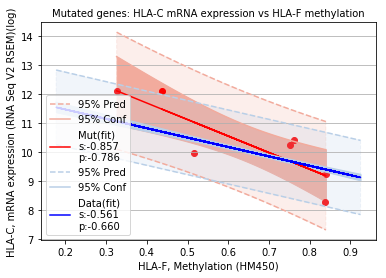

In [70]:
CIReadPlot('./plots-hlac-hlaf.txt', 'Mutated genes: HLA-C mRNA expression vs HLA-F methylation')

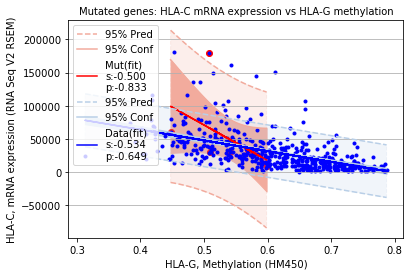

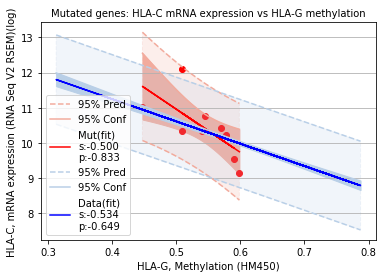

In [71]:
CIReadPlot('./plots-hlac-hlag.txt', 'Mutated genes: HLA-C mRNA expression vs HLA-G methylation')

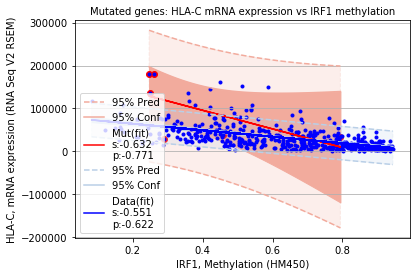

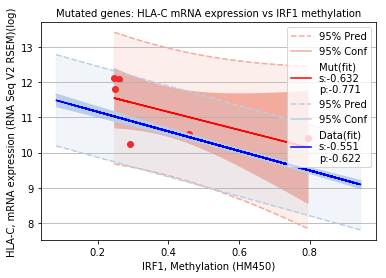

In [72]:
CIReadPlot('./plots-hlac-irf1.txt', 'Mutated genes: HLA-C mRNA expression vs IRF1 methylation')

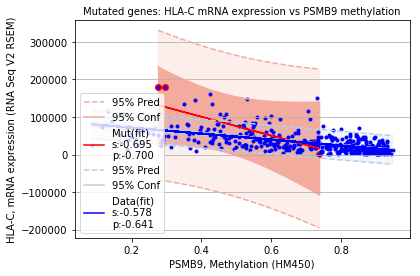

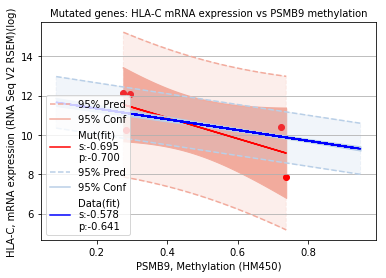

In [73]:
CIReadPlot('./plots-hlac-psmb9.txt', 'Mutated genes: HLA-C mRNA expression vs PSMB9 methylation')

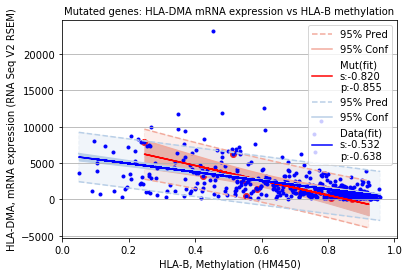

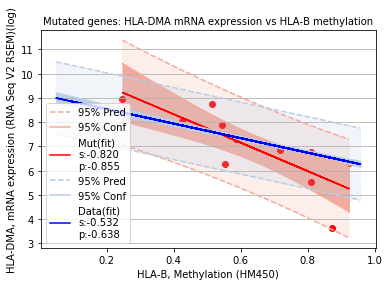

In [74]:
CIReadPlot('./plots-hladma-hlab.txt', 'Mutated genes: HLA-DMA mRNA expression vs HLA-B methylation')

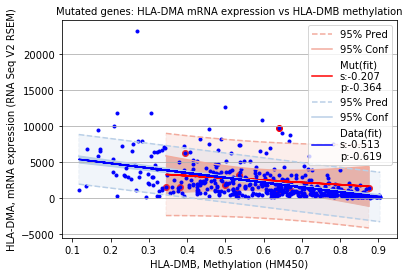

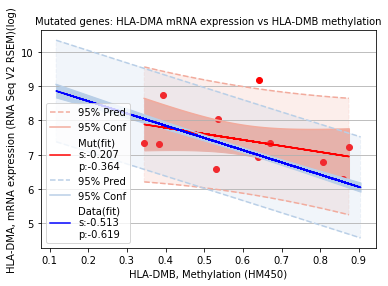

In [75]:
CIReadPlot('./plots-hladma-hladmb.txt', 'Mutated genes: HLA-DMA mRNA expression vs HLA-DMB methylation')

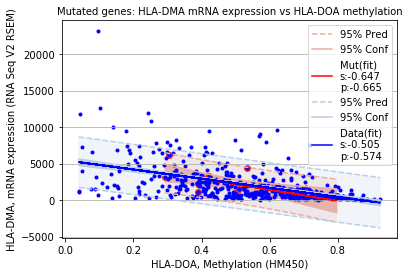

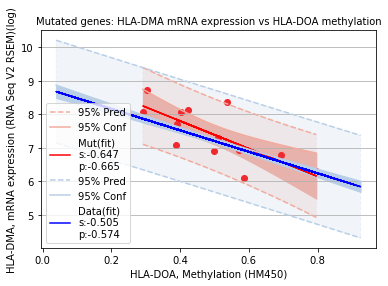

In [76]:
CIReadPlot('./plots-hladma-hladoa.txt', 'Mutated genes: HLA-DMA mRNA expression vs HLA-DOA methylation')

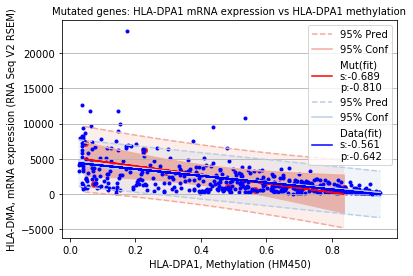

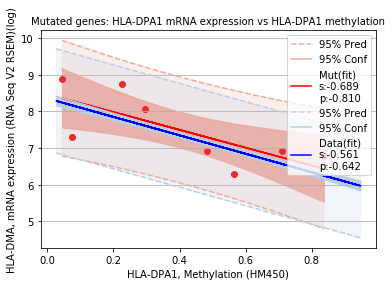

In [77]:
CIReadPlot('./plots-hladma-hladpa1.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs HLA-DPA1 methylation')

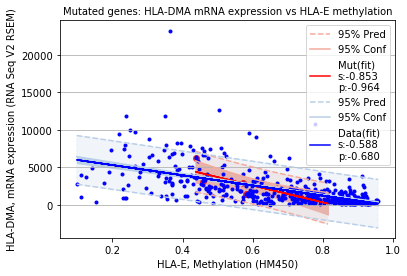

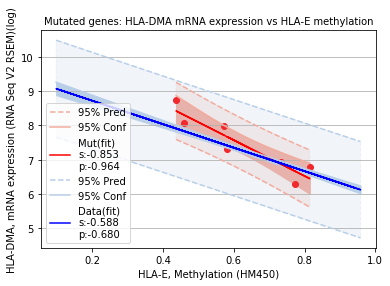

In [78]:
CIReadPlot('./plots-hladma-hlae.txt', 'Mutated genes: HLA-DMA mRNA expression vs HLA-E methylation')

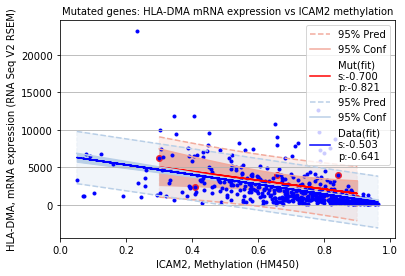

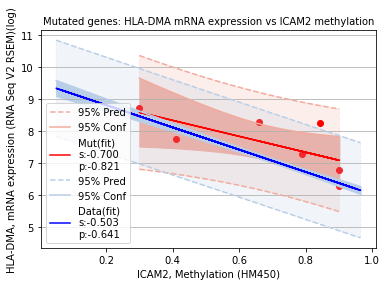

In [79]:
CIReadPlot('./plots-hladma-icam2.txt', 'Mutated genes: HLA-DMA mRNA expression vs ICAM2 methylation')

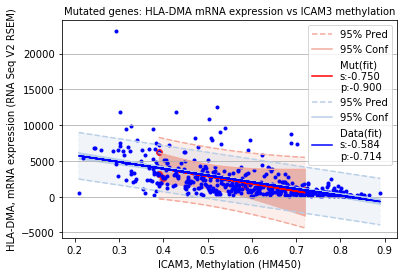

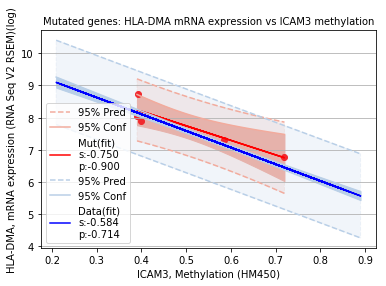

In [80]:
CIReadPlot('./plots-hladma-icam3.txt', 'Mutated genes: HLA-DMA mRNA expression vs ICAM3 methylation')

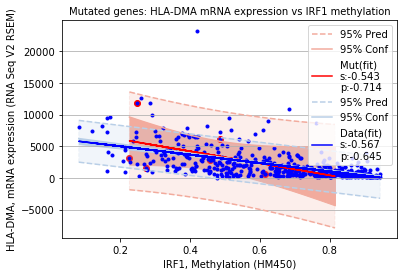

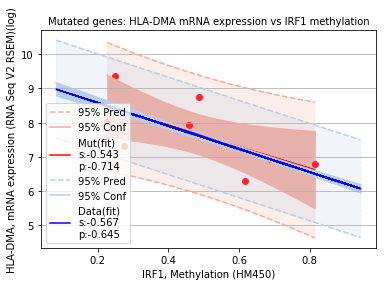

In [81]:
CIReadPlot('./plots-hladma-irf1.txt', 'Mutated genes: HLA-DMA mRNA expression vs IRF1 methylation')

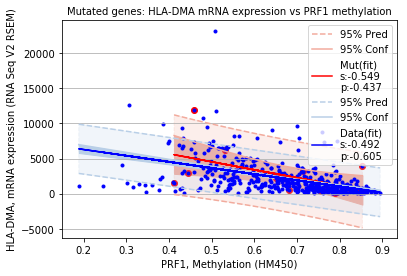

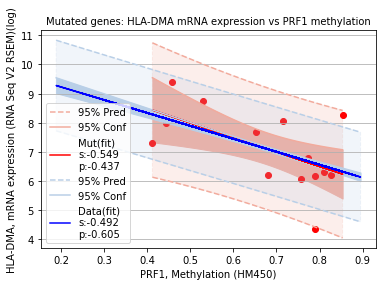

In [82]:
CIReadPlot('./plots-hladma-prf1.txt', 'Mutated genes: HLA-DMA mRNA expression vs PRF1 methylation')

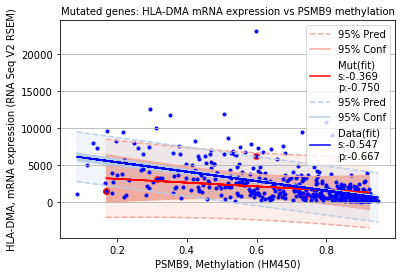

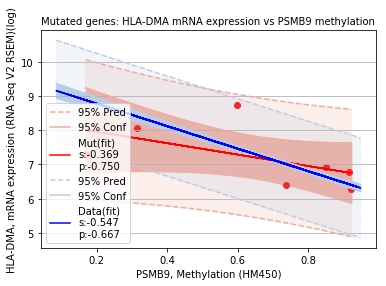

In [83]:
CIReadPlot('./plots-hladma-psmb9.txt', 'Mutated genes: HLA-DMA mRNA expression vs PSMB9 methylation')

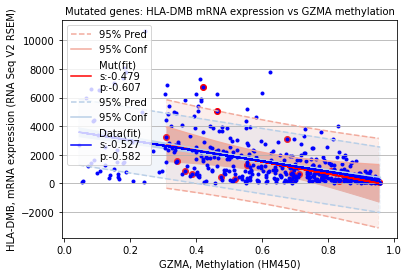

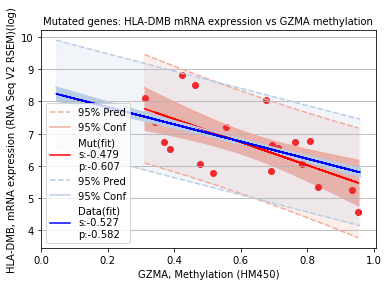

In [84]:
CIReadPlot('./plots-hladmb-gzma.txt', 'Mutated genes: HLA-DMB mRNA expression vs GZMA methylation')

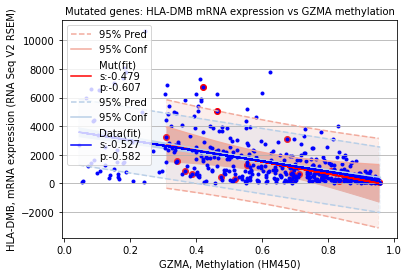

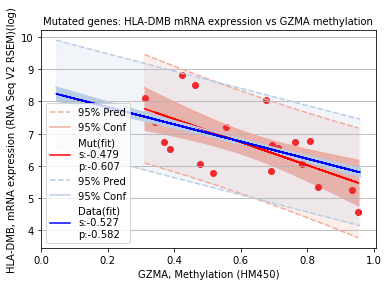

In [85]:
CIReadPlot('./plots-hladmb-gzma.txt', 'Mutated genes: HLA-DMB mRNA expression vs GZMA methylation')

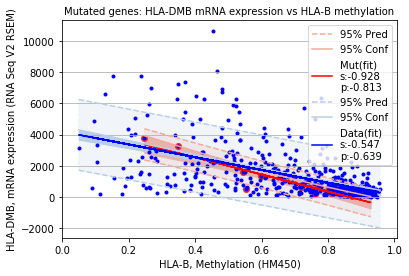

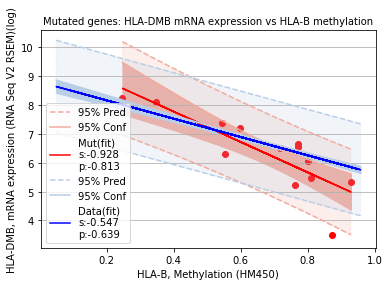

In [86]:
CIReadPlot('./plots-hladmb-hlab.txt', 'Mutated genes: HLA-DMB mRNA expression vs HLA-B methylation')

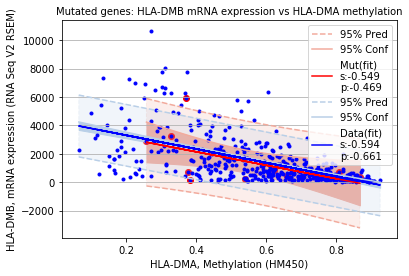

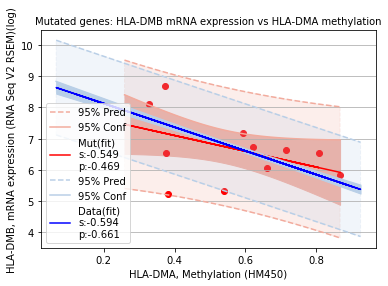

In [87]:
CIReadPlot('./plots-hladmb-hladma.txt', 'Mutated genes: HLA-DMB mRNA expression vs HLA-DMA methylation')

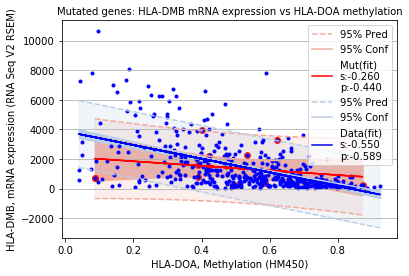

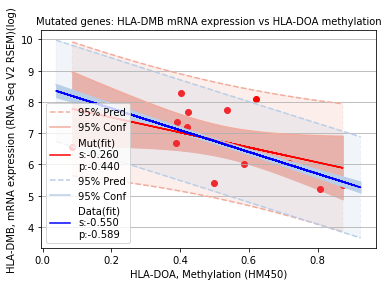

In [88]:
CIReadPlot('./plots-hladmb-hladoa.txt', 'Mutated genes: HLA-DMB mRNA expression vs HLA-DOA methylation')

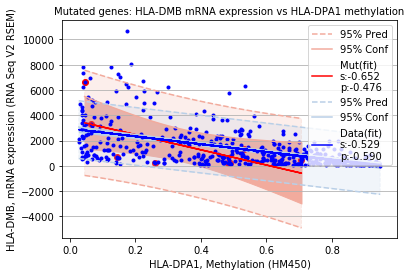

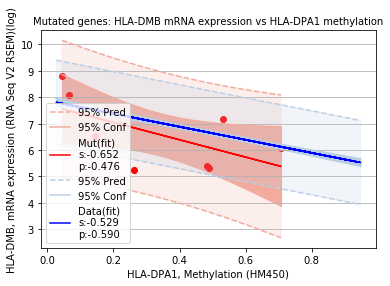

In [89]:
CIReadPlot('./plots-hladmb-hladpa1.txt', 'Mutated genes: HLA-DMB mRNA expression vs HLA-DPA1 methylation')

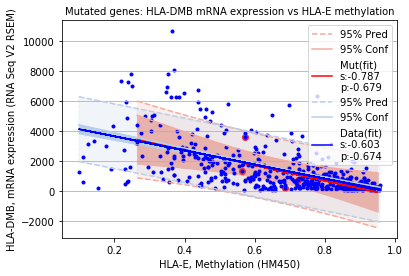

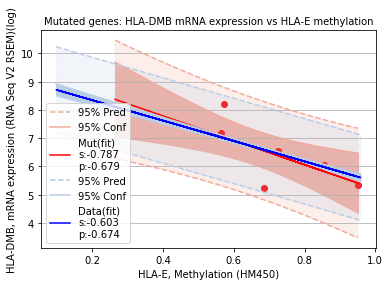

In [90]:
CIReadPlot('./plots-hladmb-hlae.txt', 'Mutated genes: HLA-DMB mRNA expression vs HLA-E methylation')

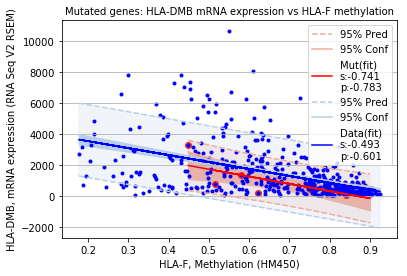

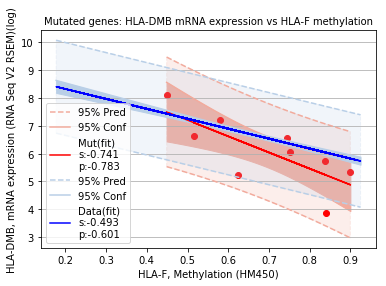

In [91]:
CIReadPlot('./plots-hladmb-hlaf.txt', 'Mutated genes: HLA-DMB mRNA expression vs HLA-F methylation')

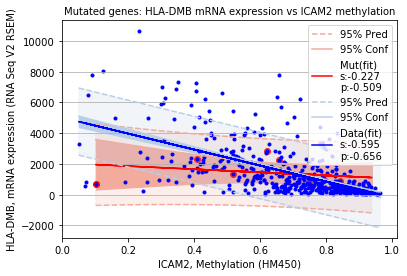

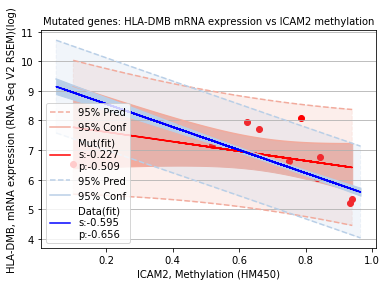

In [92]:
CIReadPlot('./plots-hladmb-icam2.txt', 'Mutated genes: HLA-DMB mRNA expression vs ICAM2 methylation')

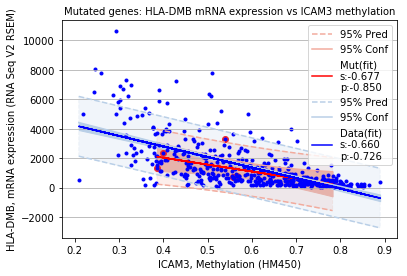

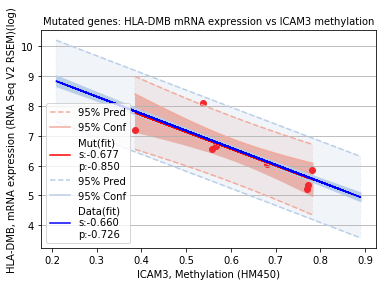

In [93]:
CIReadPlot('./plots-hladmb-icam3.txt', 'Mutated genes: HLA-DMB mRNA expression vs ICAM3 methylation')

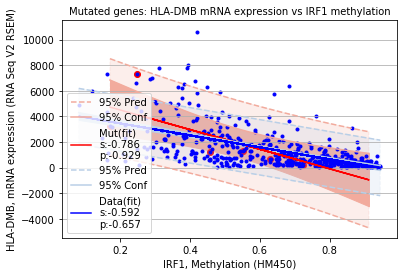

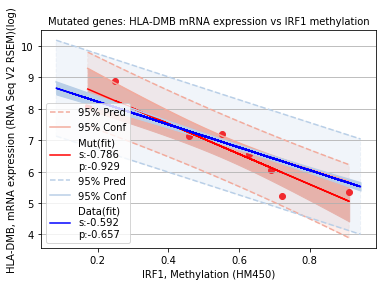

In [94]:
CIReadPlot('./plots-hladmb-irf1.txt', 'Mutated genes: HLA-DMB mRNA expression vs IRF1 methylation')

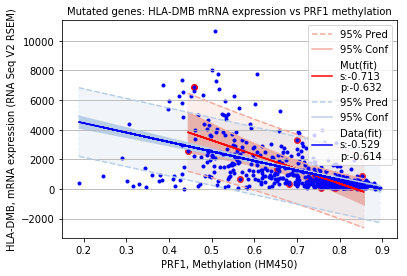

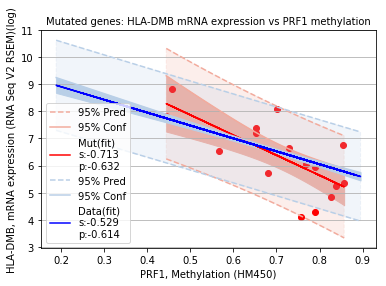

In [95]:
CIReadPlot('./plots-hladmb-prf1.txt', 'Mutated genes: HLA-DMB mRNA expression vs PRF1 methylation')

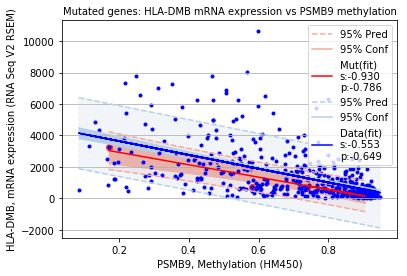

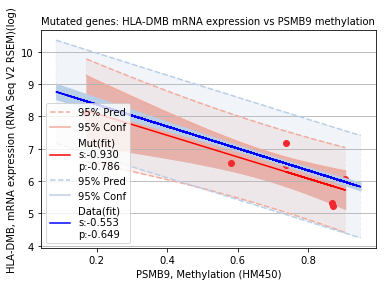

In [96]:
CIReadPlot('./plots-hladmb-psmb9.txt', 'Mutated genes: HLA-DMB mRNA expression vs PSMB9 methylation')

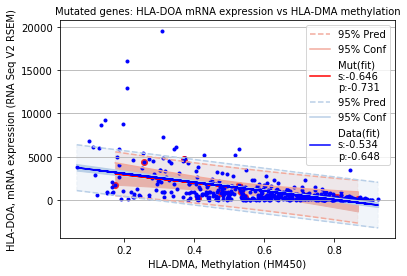

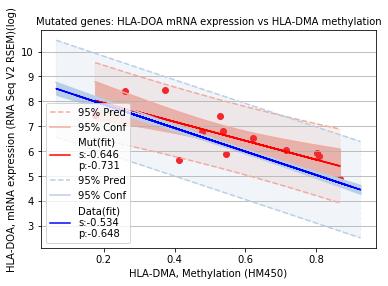

In [97]:
CIReadPlot('./plots-hladoa-hladma.txt', 'Mutated genes: HLA-DOA mRNA expression vs HLA-DMA methylation')

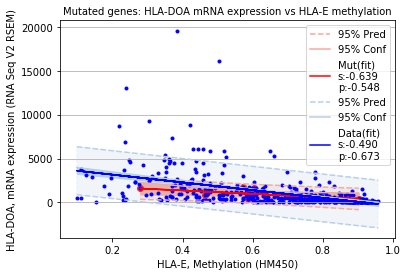

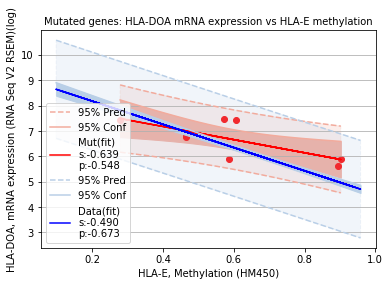

In [98]:
CIReadPlot('./plots-hladoa-hlae.txt', 'Mutated genes: HLA-DOA mRNA expression vs HLA-E methylation')

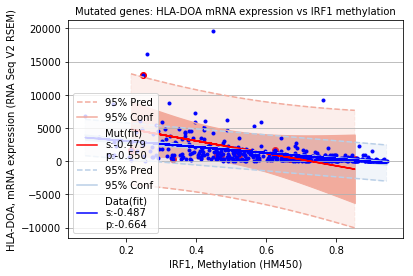

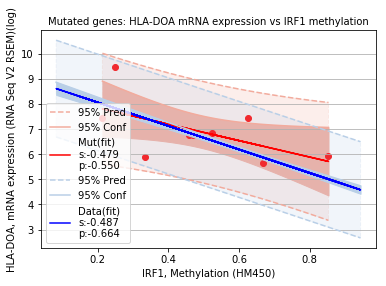

In [99]:
CIReadPlot('./plots-hladoa-irf1.txt', 'Mutated genes: HLA-DOA mRNA expression vs IRF1 methylation')

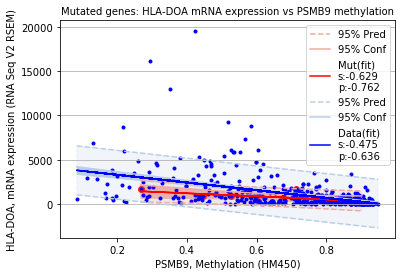

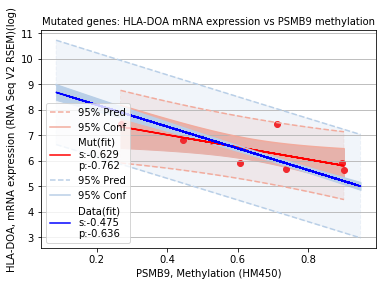

In [100]:
CIReadPlot('./plots-hladoa-psmb9.txt', 'Mutated genes: HLA-DOA mRNA expression vs PSMB9 methylation')

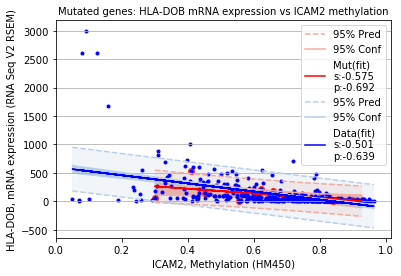

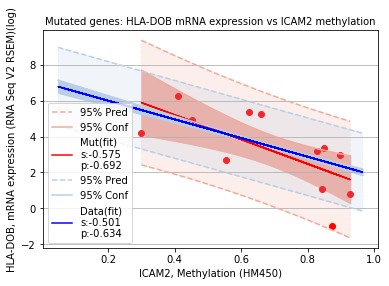

In [101]:
CIReadPlot('./plots-hladob-icam2.txt', 'Mutated genes: HLA-DOB mRNA expression vs ICAM2 methylation')

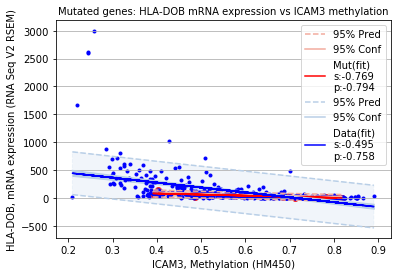

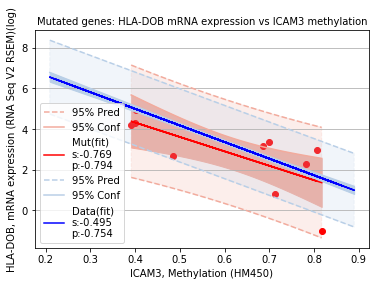

In [102]:
CIReadPlot('./plots-hladob-icam3.txt', 'Mutated genes: HLA-DOB mRNA expression vs ICAM3 methylation')

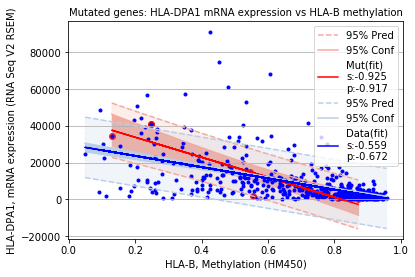

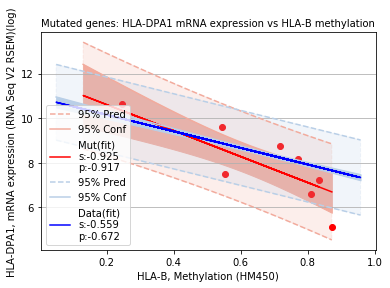

In [103]:
CIReadPlot('./plots-hladpa1-hlab.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs HLA-B methylation')

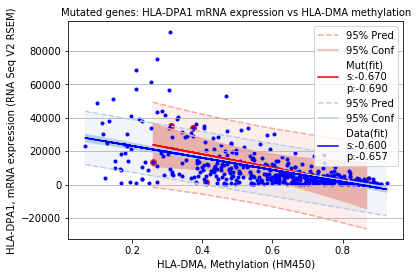

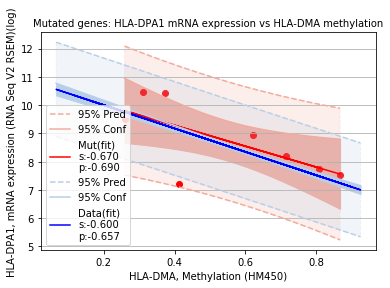

In [104]:
CIReadPlot('./plots-hladpa1-hladma.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs HLA-DMA methylation')

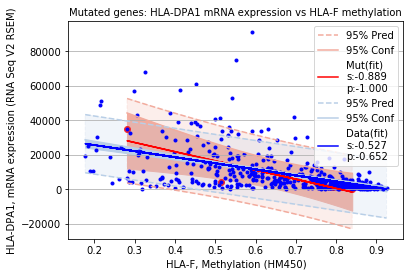

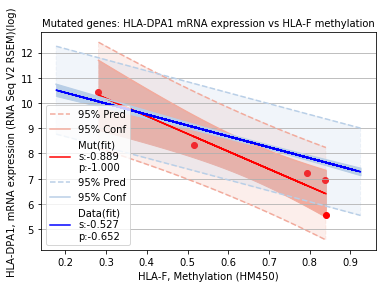

In [105]:
CIReadPlot('./plots-hladpa1-hlaf.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs HLA-F methylation')

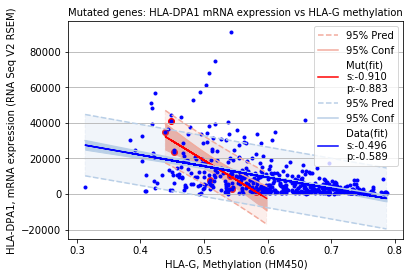

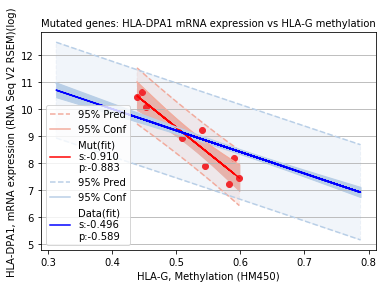

In [106]:
CIReadPlot('./plots-hladpa1-hlag.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs HLA-G methylation')

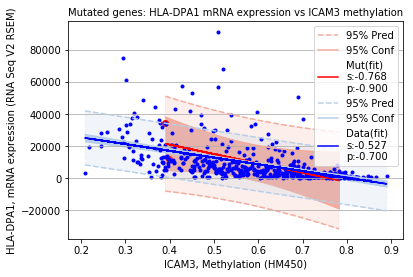

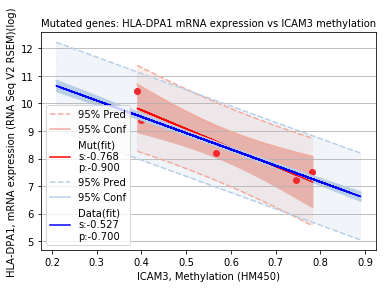

In [107]:
CIReadPlot('./plots-hladpa1-icam3.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs ICAM3 methylation')

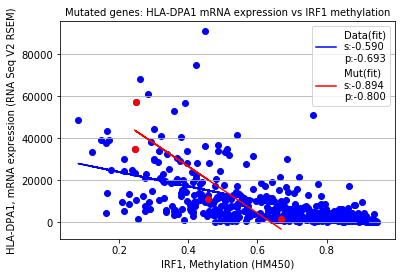

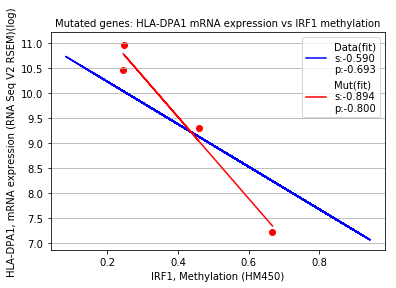

In [108]:
mutReadPlot('./plots-hladpa1-irf1.txt', 'Mutated genes: HLA-DPA1 mRNA expression vs IRF1 methylation')
# CIReadPlot throws error in np.polyfit. Need to check

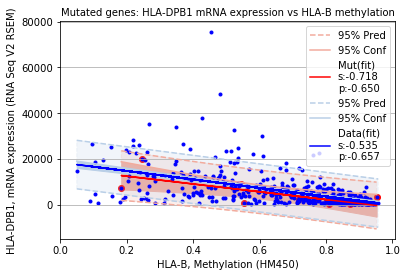

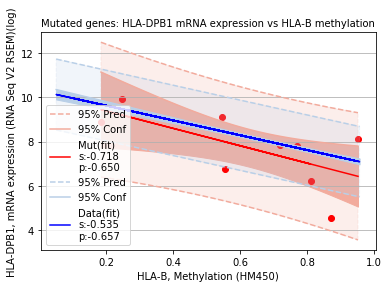

In [109]:
CIReadPlot('./plots-hladpb1-hlab.txt', 'Mutated genes: HLA-DPB1 mRNA expression vs HLA-B methylation')

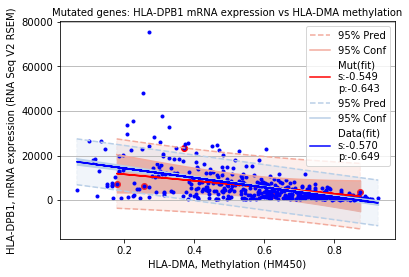

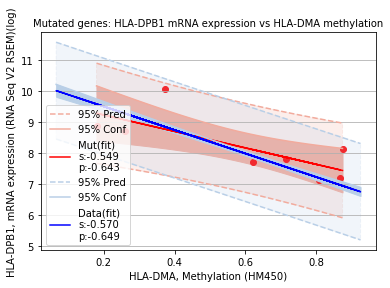

In [110]:
CIReadPlot('./plots-hladpb1-hladma.txt', 'Mutated genes: HLA-DPB1 mRNA expression vs HLA-DMA methylation')

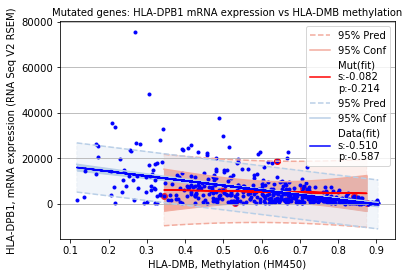

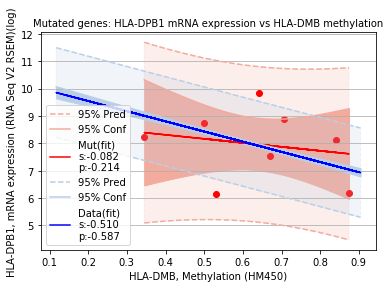

In [111]:
CIReadPlot('./plots-hladpb1-hladmb.txt', 'Mutated genes: HLA-DPB1 mRNA expression vs HLA-DMB methylation')

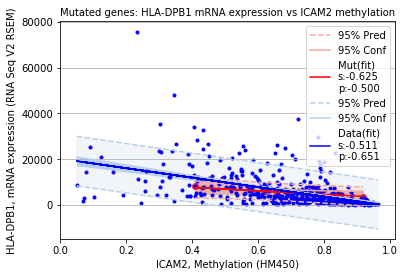

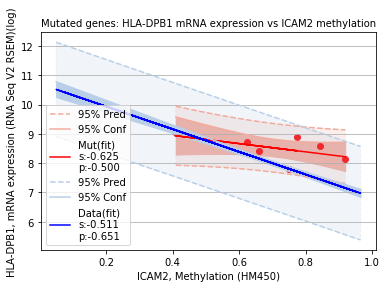

In [112]:
CIReadPlot('./plots-hladpb1-icam2.txt', 'Mutated genes: HLA-DPB1 mRNA expression vs ICAM2 methylation')

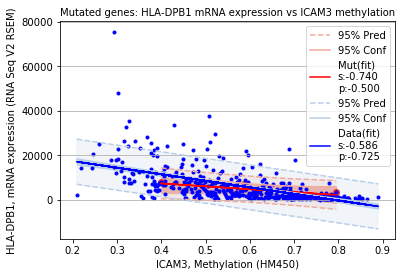

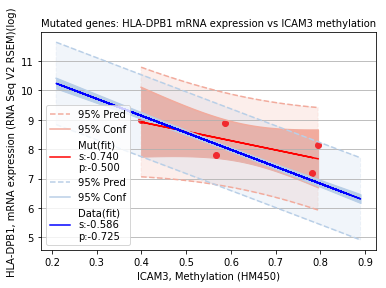

In [113]:
CIReadPlot('./plots-hladpb1-icam3.txt', 'Mutated genes: HLA-DPB1 mRNA expression vs ICAM3 methylation')

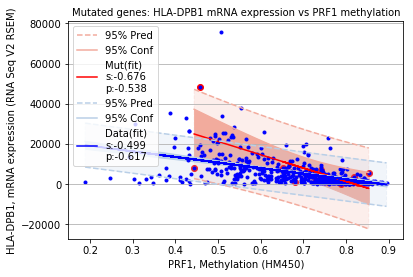

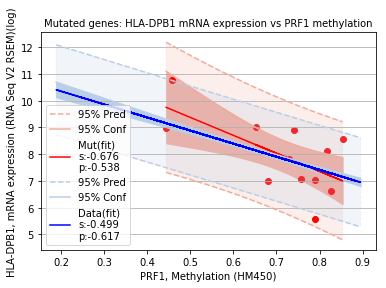

In [114]:
CIReadPlot('./plots-hladpb1-prf1.txt', 'Mutated genes: HLA-DPB1 mRNA expression vs PRF1 methylation')

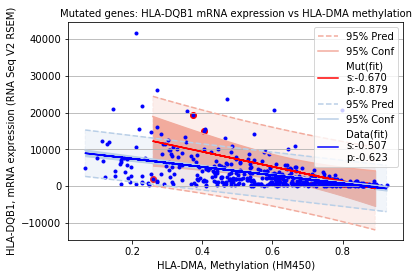

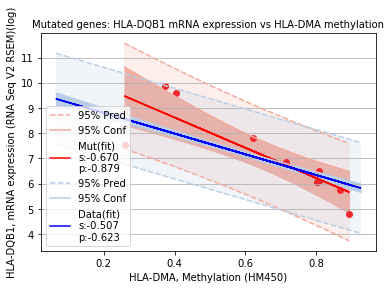

In [115]:
CIReadPlot('./plots-hladqb1-hladma.txt', 'Mutated genes: HLA-DQB1 mRNA expression vs HLA-DMA methylation')

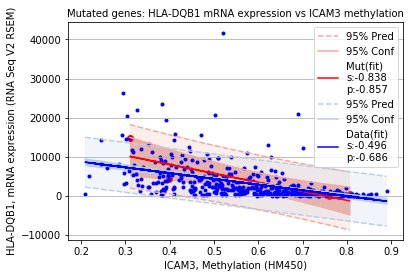

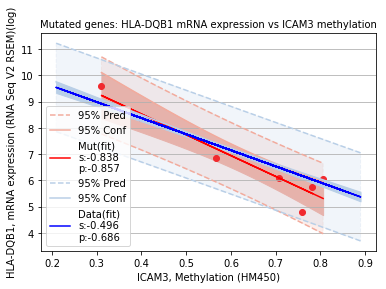

In [116]:
CIReadPlot('./plots-hladqb1-icam3.txt', 'Mutated genes: HLA-DQB1 mRNA expression vs ICAM3 methylation')

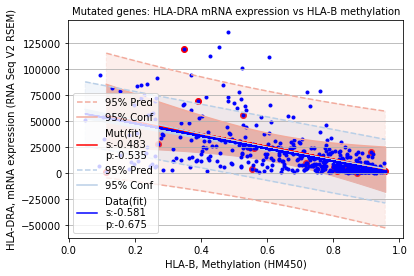

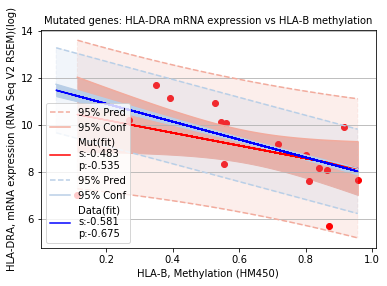

In [117]:
CIReadPlot('./plots-hladra-hlab.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-B methylation')

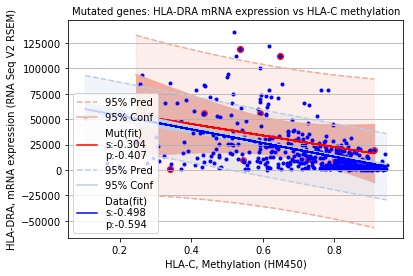

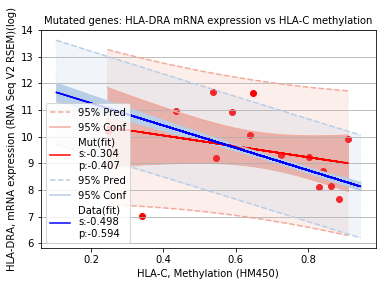

In [118]:
CIReadPlot('./plots-hladra-hlac.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-C methylation')

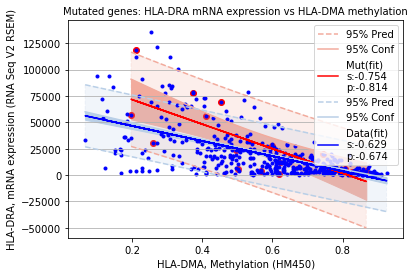

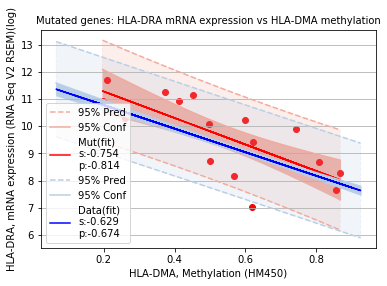

In [119]:
CIReadPlot('./plots-hladra-hladma.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-DMA methylation')

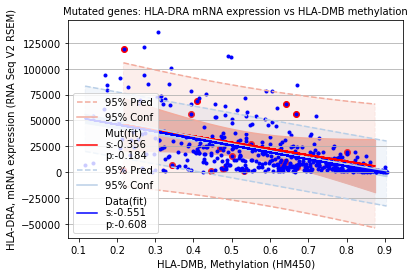

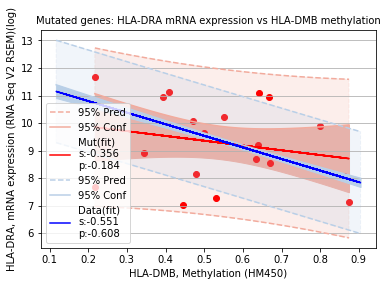

In [120]:
CIReadPlot('./plots-hladra-hladmb.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-DMB methylation')

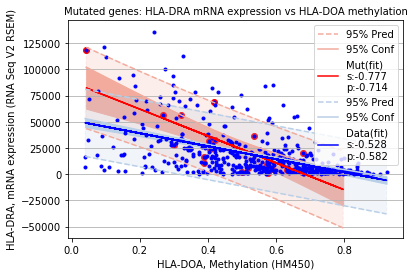

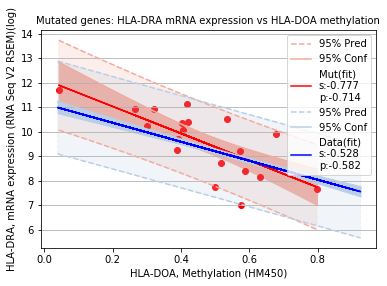

In [121]:
CIReadPlot('./plots-hladra-hladoa.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-DOA methylation')

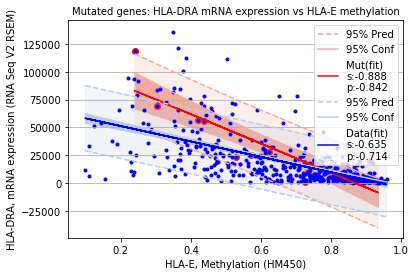

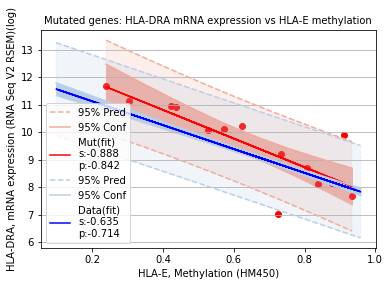

In [122]:
CIReadPlot('./plots-hladra-hlae.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-E methylation')

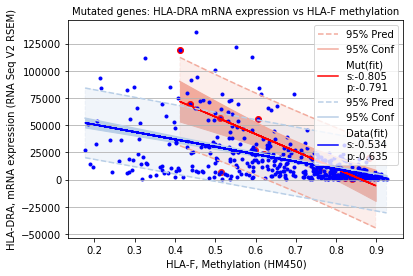

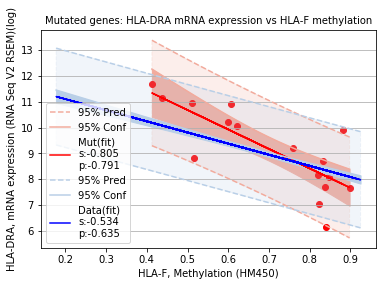

In [123]:
CIReadPlot('./plots-hladra-hlaf.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-F methylation')

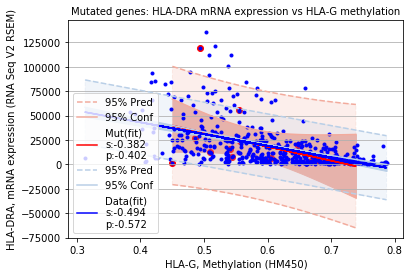

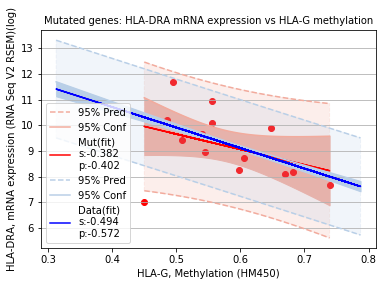

In [124]:
CIReadPlot('./plots-hladra-hlag.txt', 'Mutated genes: HLA-DRA mRNA expression vs HLA-G methylation')

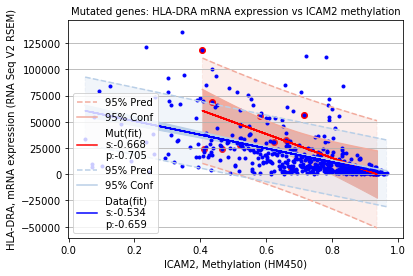

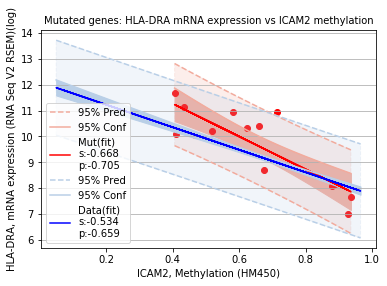

In [125]:
CIReadPlot('./plots-hladra-icam2.txt', 'Mutated genes: HLA-DRA mRNA expression vs ICAM2 methylation')

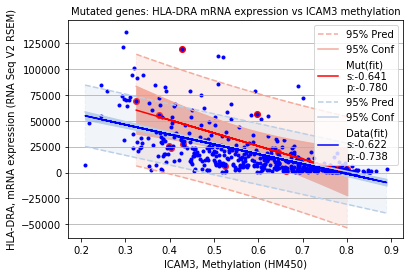

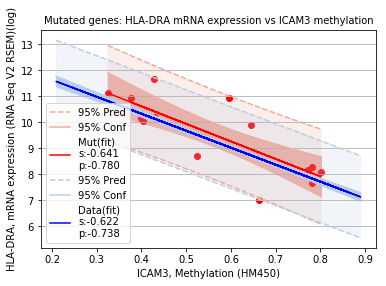

In [126]:
CIReadPlot('./plots-hladra-icam3.txt', 'Mutated genes: HLA-DRA mRNA expression vs ICAM3 methylation')

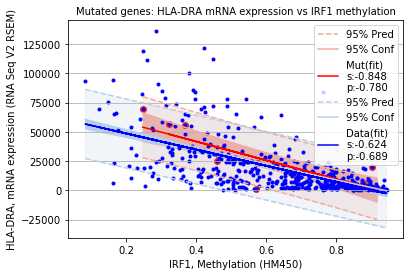

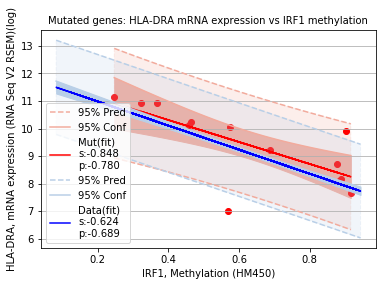

In [127]:
CIReadPlot('./plots-hladra-irf1.txt', 'Mutated genes: HLA-DRA mRNA expression vs IRF1 methylation')

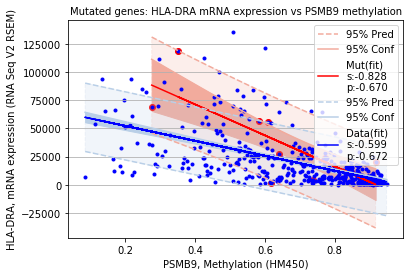

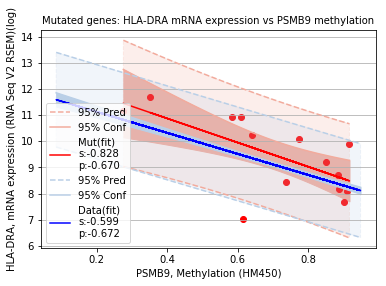

In [128]:
CIReadPlot('./plots-hladra-psmb9.txt', 'Mutated genes: HLA-DRA mRNA expression vs PSMB9 methylation')

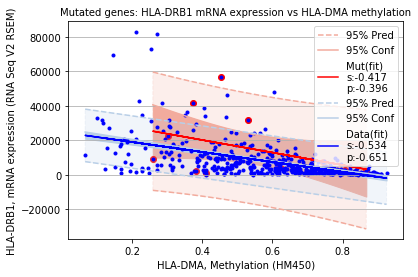

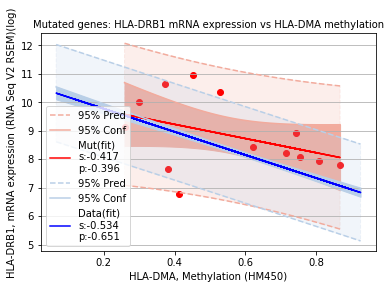

In [129]:
CIReadPlot('./plots-hladrb1-hladma.txt', 'Mutated genes: HLA-DRB1 mRNA expression vs HLA-DMA methylation')

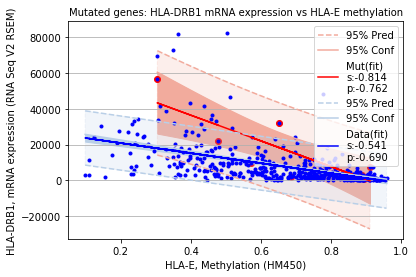

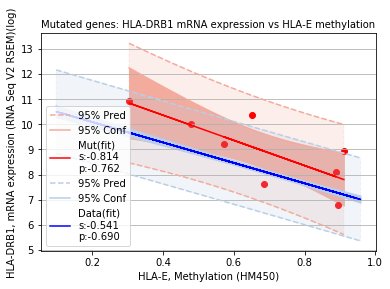

In [130]:
CIReadPlot('./plots-hladrb1-hlae.txt', 'Mutated genes: HLA-DRB1 mRNA expression vs HLA-E methylation')

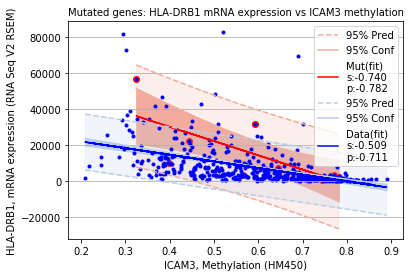

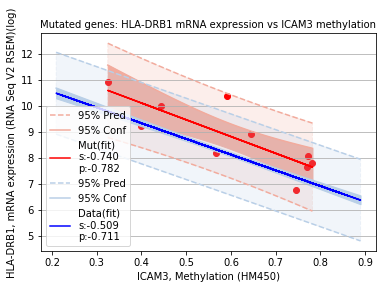

In [131]:
CIReadPlot('./plots-hladrb1-icam3.txt', 'Mutated genes: HLA-DRB1 mRNA expression vs ICAM3 methylation')

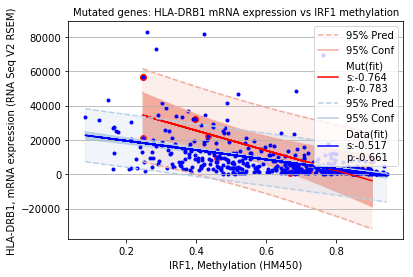

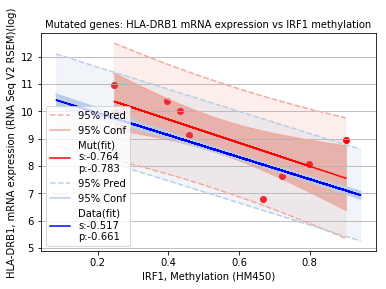

In [132]:
CIReadPlot('./plots-hladrb1-irf1.txt', 'Mutated genes: HLA-DRB1 mRNA expression vs IRF1 methylation')

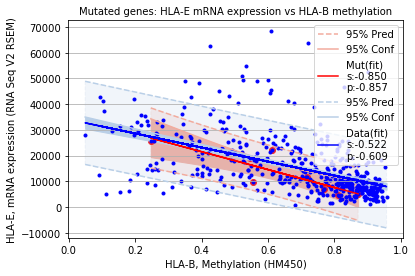

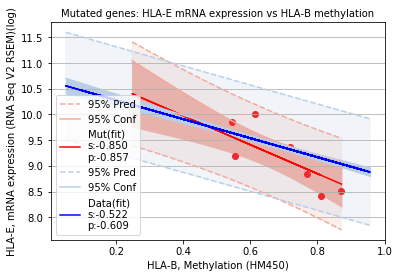

In [133]:
CIReadPlot('./plots-hlae-hlab.txt', 'Mutated genes: HLA-E mRNA expression vs HLA-B methylation')

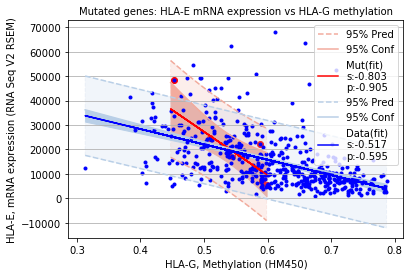

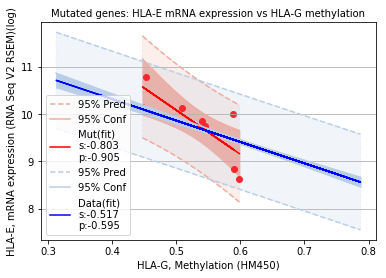

In [134]:
CIReadPlot('./plots-hlae-hlag.txt', 'Mutated genes: HLA-E mRNA expression vs HLA-G methylation')

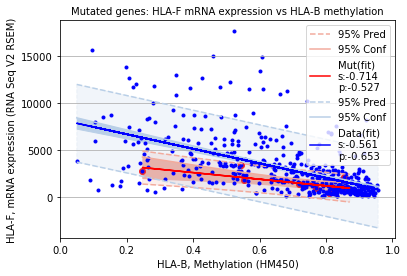

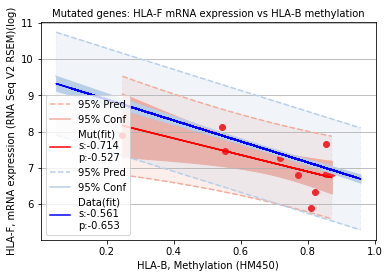

In [135]:
CIReadPlot('./plots-hlaf-hlab.txt', 'Mutated genes: HLA-F mRNA expression vs HLA-B methylation')

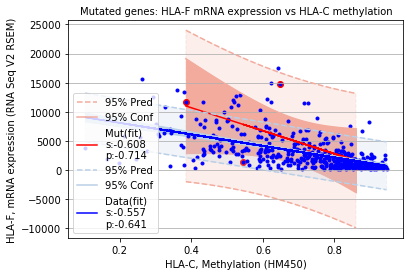

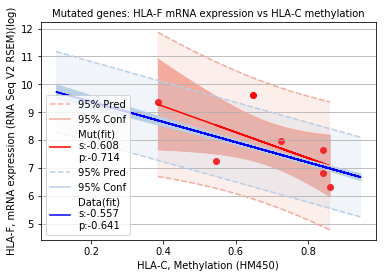

In [136]:
CIReadPlot('./plots-hlaf-hlac.txt', 'Mutated genes: HLA-F mRNA expression vs HLA-C methylation')

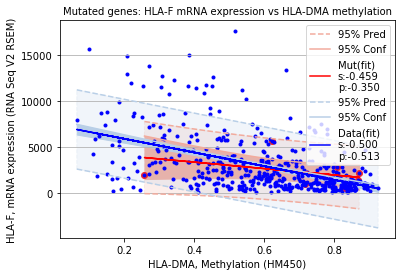

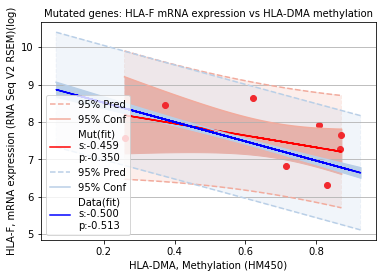

In [137]:
CIReadPlot('./plots-hlaf-hladma.txt', 'Mutated genes: HLA-F mRNA expression vs HLA-DMA methylation')

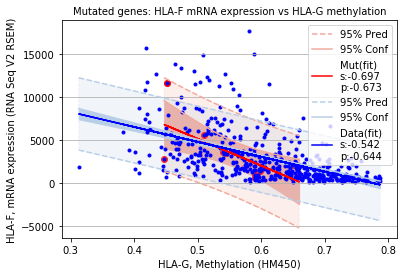

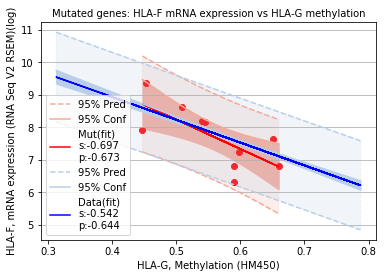

In [138]:
CIReadPlot('./plots-hlaf-hlag.txt', 'Mutated genes: HLA-F mRNA expression vs HLA-G methylation')

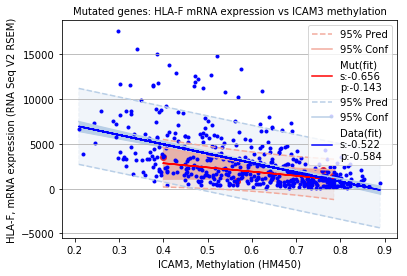

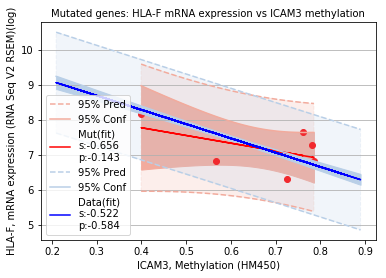

In [139]:
CIReadPlot('./plots-hlaf-icam3.txt', 'Mutated genes: HLA-F mRNA expression vs ICAM3 methylation')

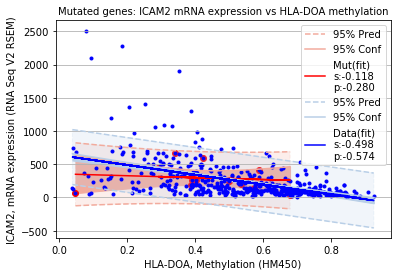

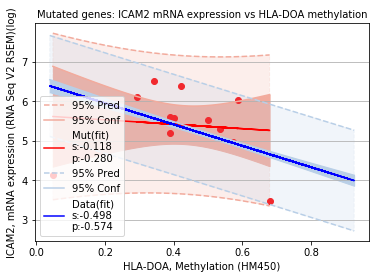

In [140]:
CIReadPlot('./plots-icam2-hladoa.txt', 'Mutated genes: ICAM2 mRNA expression vs HLA-DOA methylation')

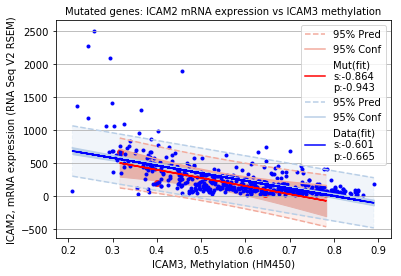

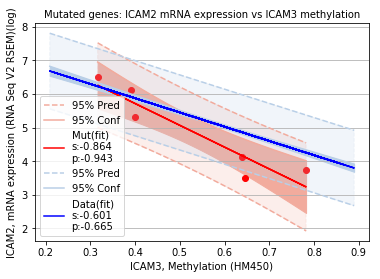

In [141]:
CIReadPlot('./plots-icam2-icam3.txt', 'Mutated genes: ICAM2 mRNA expression vs ICAM3 methylation')

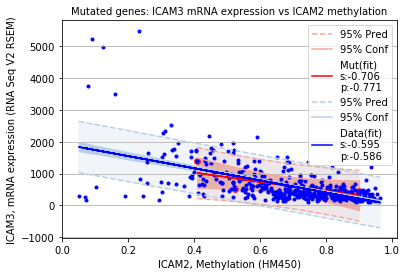

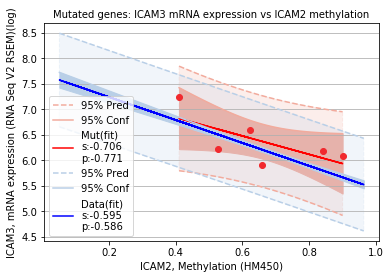

In [142]:
CIReadPlot('./plots-icam3-icam2.txt', 'Mutated genes: ICAM3 mRNA expression vs ICAM2 methylation')

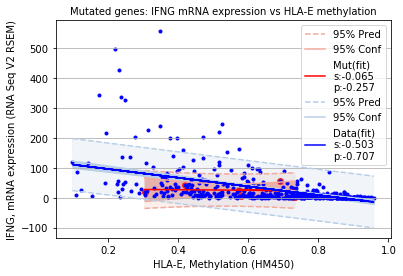

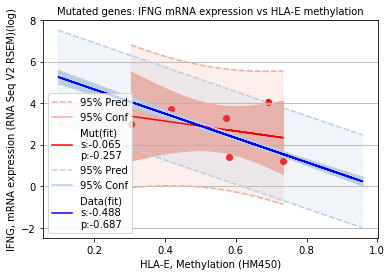

In [143]:
CIReadPlot('./plots-ifng-hlae.txt', 'Mutated genes: IFNG mRNA expression vs HLA-E methylation')

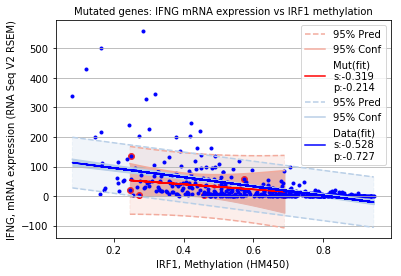

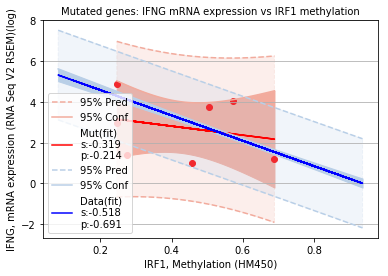

In [144]:
CIReadPlot('./plots-ifng-irf1.txt', 'Mutated genes: IFNG mRNA expression vs IRF1 methylation')

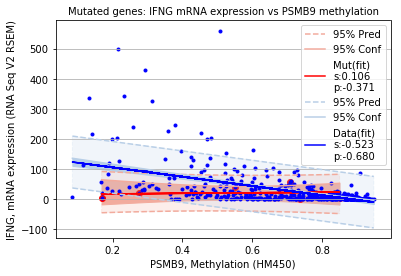

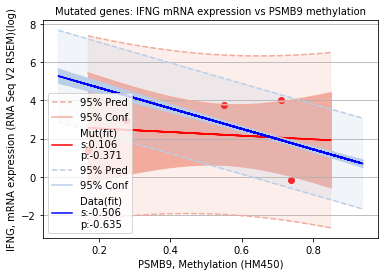

In [145]:
CIReadPlot('./plots-ifng-psmb9.txt', 'Mutated genes: IFNG mRNA expression vs PSMB9 methylation')

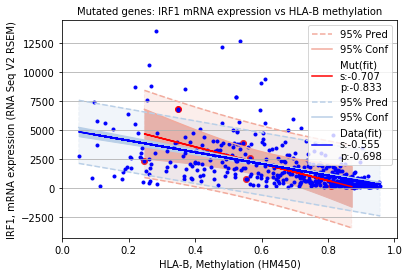

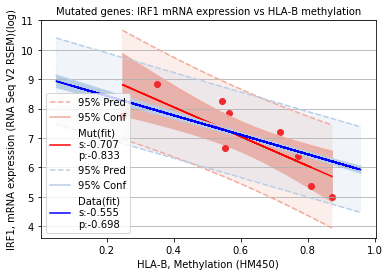

In [146]:
CIReadPlot('./plots-irf1-hlab.txt', 'Mutated genes: IRF1 mRNA expression vs HLA-B methylation')

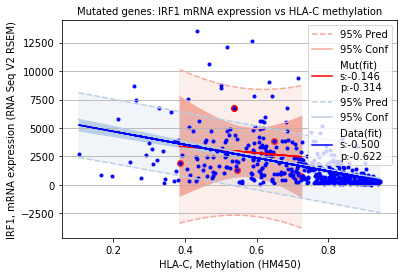

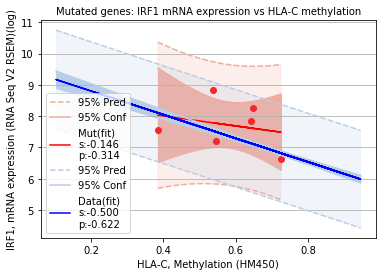

In [147]:
CIReadPlot('./plots-irf1-hlac.txt', 'Mutated genes: IRF1 mRNA expression vs HLA-C methylation')

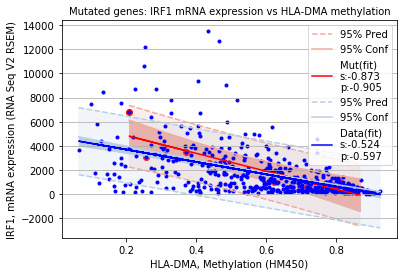

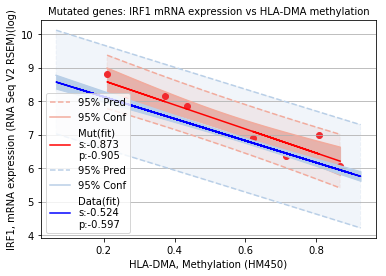

In [148]:
CIReadPlot('./plots-irf1-hladma.txt', 'Mutated genes: IRF1 mRNA expression vs HLA-DMA methylation')

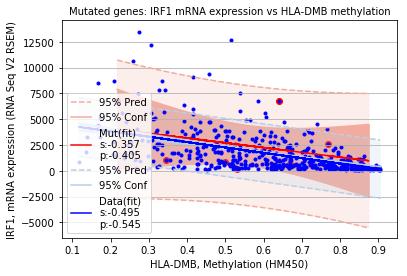

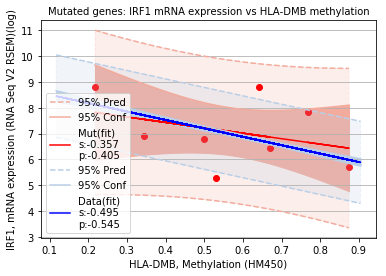

In [149]:
CIReadPlot('./plots-irf1-hladmb.txt', 'Mutated genes: IRF1 mRNA expression vs HLA-DMB methylation')

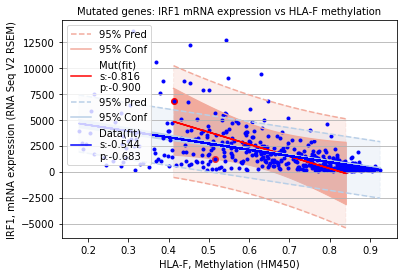

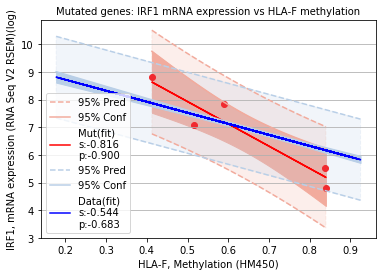

In [150]:
CIReadPlot('./plots-irf1-hlaf.txt', 'Mutated genes: IRF1 mRNA expression vs HLA-F methylation')

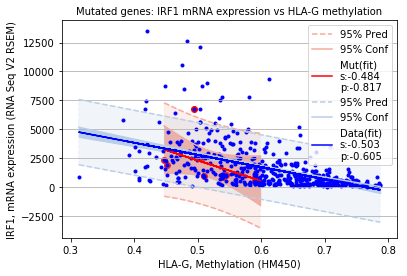

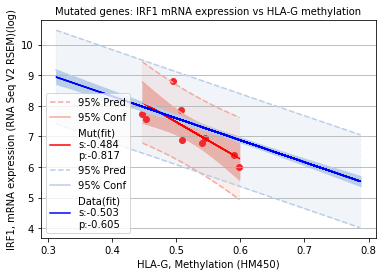

In [151]:
CIReadPlot('./plots-irf1-hlag.txt', 'Mutated genes: IRF1 mRNA expression vs HLA-G methylation')

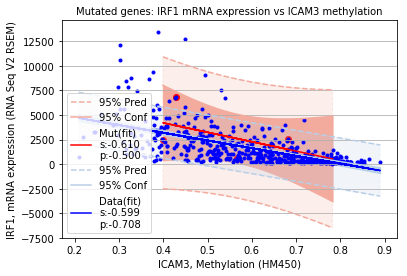

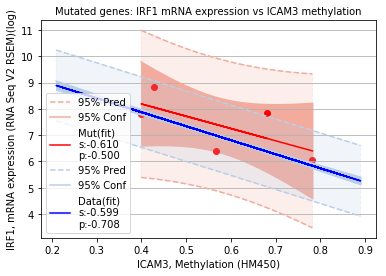

In [152]:
CIReadPlot('./plots-irf1-icam3.txt', 'Mutated genes: IRF1 mRNA expression vs ICAM3 methylation')

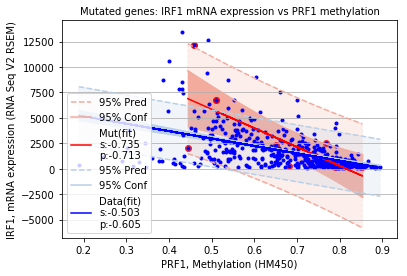

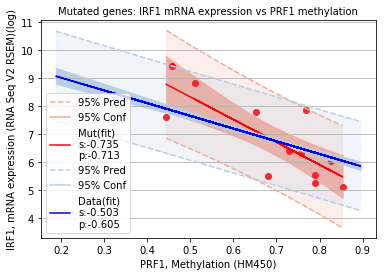

In [153]:
CIReadPlot('./plots-irf1-prf1.txt', 'Mutated genes: IRF1 mRNA expression vs PRF1 methylation')

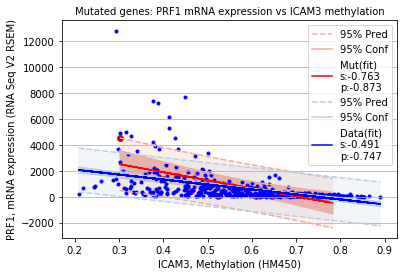

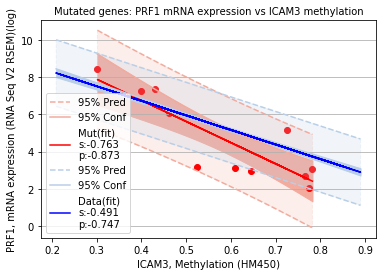

In [154]:
CIReadPlot('./plots-prf1-icam3.txt', 'Mutated genes: PRF1 mRNA expression vs ICAM3 methylation')

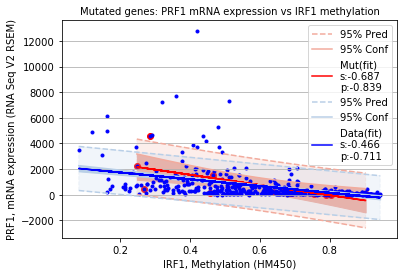

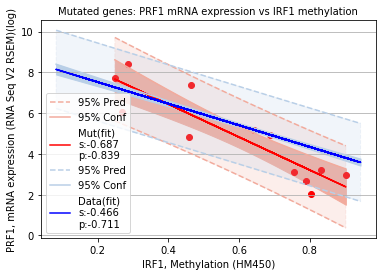

In [155]:
CIReadPlot('./plots-prf1-irf1.txt', 'Mutated genes: PRF1 mRNA expression vs IRF1 methylation')

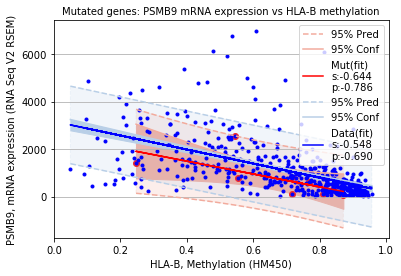

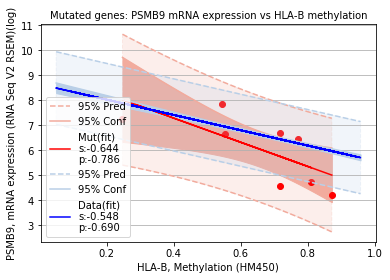

In [156]:
CIReadPlot('./plots-psmb9-hlab.txt', 'Mutated genes: PSMB9 mRNA expression vs HLA-B methylation')

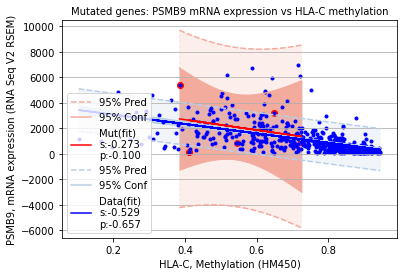

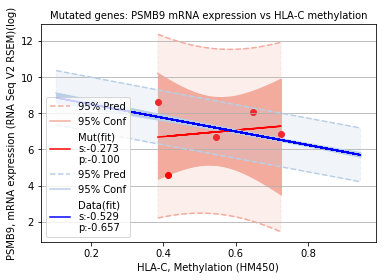

In [157]:
CIReadPlot('./plots-psmb9-hlac.txt', 'Mutated genes: PSMB9 mRNA expression vs HLA-C methylation')

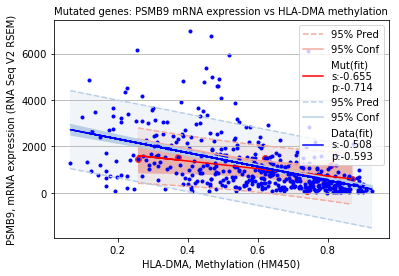

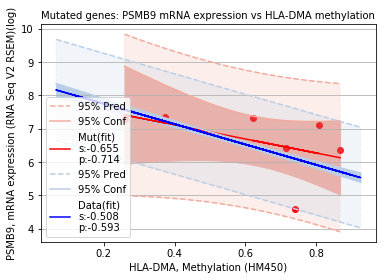

In [158]:
CIReadPlot('./plots-psmb9-hladma.txt', 'Mutated genes: PSMB9 mRNA expression vs HLA-DMA methylation')

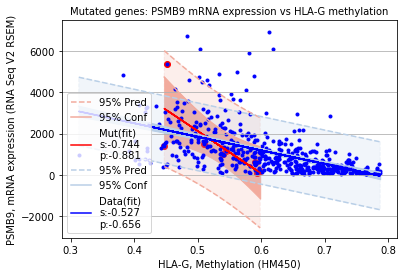

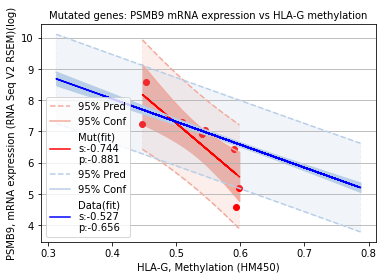

In [159]:
CIReadPlot('./plots-psmb9-hlag.txt', 'Mutated genes: PSMB9 mRNA expression vs HLA-G methylation')

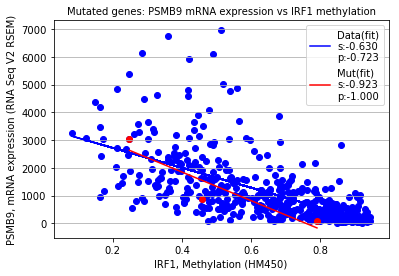

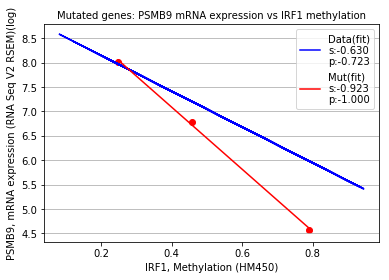

In [160]:
mutReadPlot('./plots-psmb9-irf1.txt', 'Mutated genes: PSMB9 mRNA expression vs IRF1 methylation')
# CIReadPlot throws error in numpy lib. Need to check why

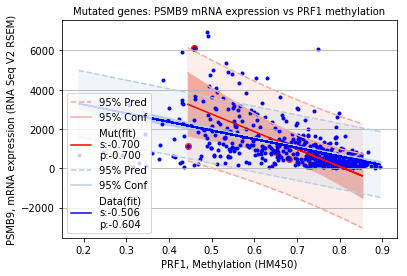

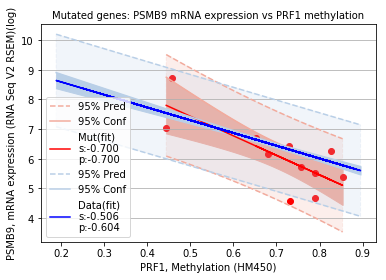

In [161]:
CIReadPlot('./plots-psmb9-prf1.txt', 'Mutated genes: PSMB9 mRNA expression vs PRF1 methylation')

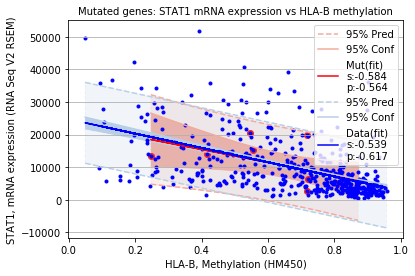

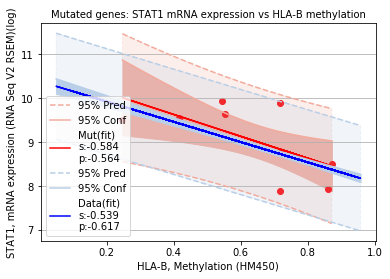

In [162]:
CIReadPlot('./plots-stat1-hlab.txt', 'Mutated genes: STAT1 mRNA expression vs HLA-B methylation')

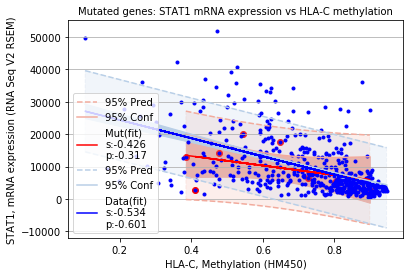

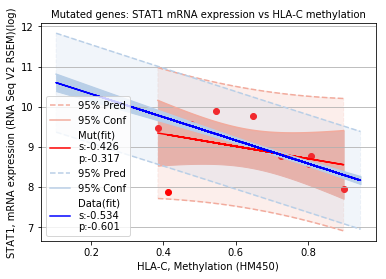

In [163]:
CIReadPlot('./plots-stat1-hlac.txt', 'Mutated genes: STAT1 mRNA expression vs HLA-C methylation')

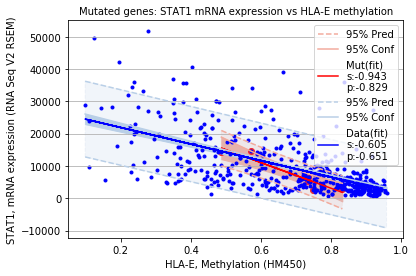

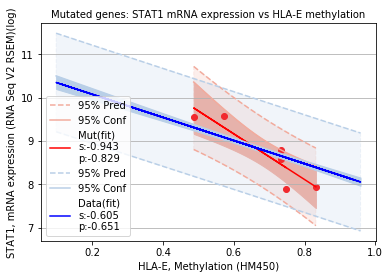

In [164]:
CIReadPlot('./plots-stat1-hlae.txt', 'Mutated genes: STAT1 mRNA expression vs HLA-E methylation')

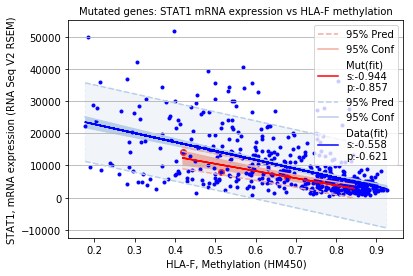

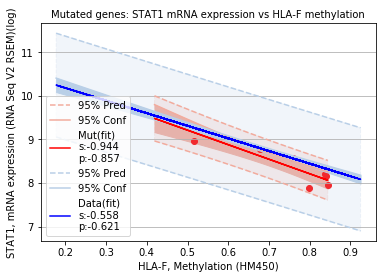

In [165]:
CIReadPlot('./plots-stat1-hlaf.txt', 'Mutated genes: STAT1 mRNA expression vs HLA-F methylation')

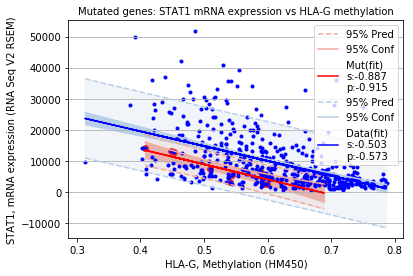

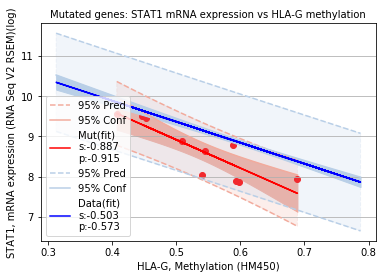

In [166]:
CIReadPlot('./plots-stat1-hlag.txt', 'Mutated genes: STAT1 mRNA expression vs HLA-G methylation')

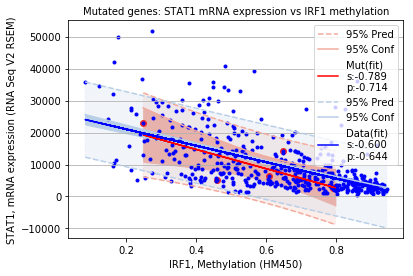

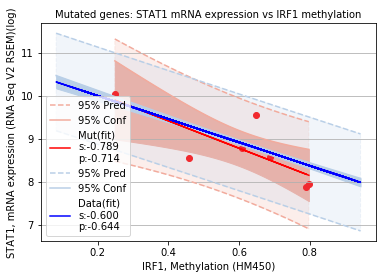

In [167]:
CIReadPlot('./plots-stat1-irf1.txt', 'Mutated genes: STAT1 mRNA expression vs IRF1 methylation')

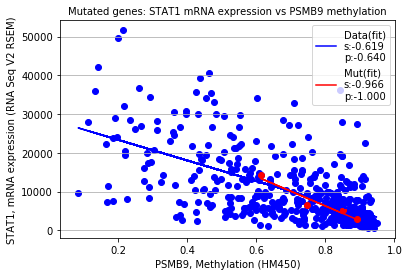

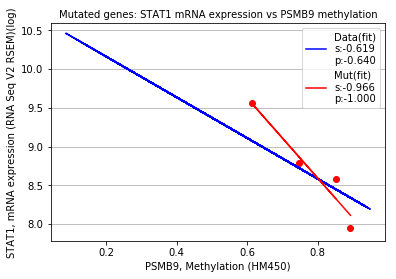

In [168]:
mutReadPlot('./plots-stat1-psmb9.txt', 'Mutated genes: STAT1 mRNA expression vs PSMB9 methylation')

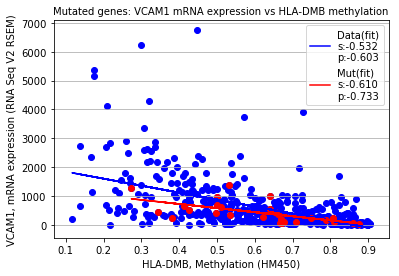

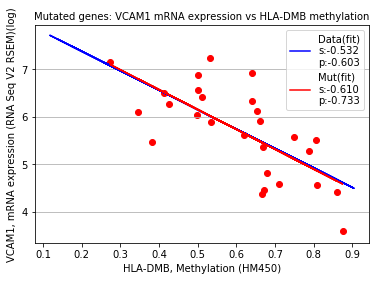

In [169]:
mutReadPlot('./plots-vcam1-hladmb.txt', 'Mutated genes: VCAM1 mRNA expression vs HLA-DMB methylation')
# CIReadPlot throws error in np.polyfit. Need to check why

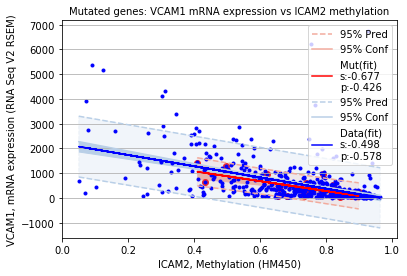

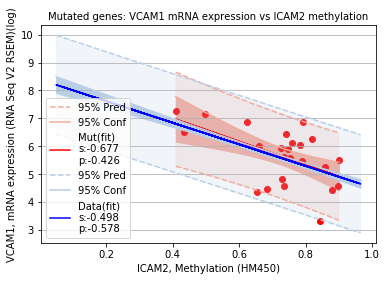

In [170]:
CIReadPlot('./plots-vcam1-icam2.txt', 'Mutated genes: VCAM1 mRNA expression vs ICAM2 methylation')

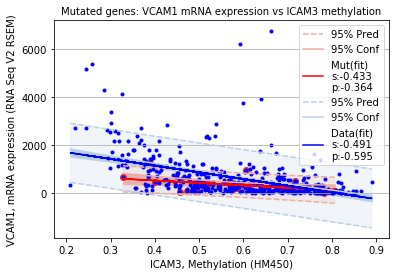

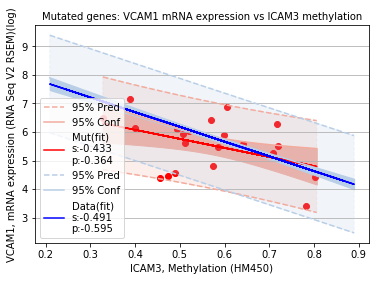

In [171]:
CIReadPlot('./plots-vcam1-icam3.txt', 'Mutated genes: VCAM1 mRNA expression vs ICAM3 methylation')

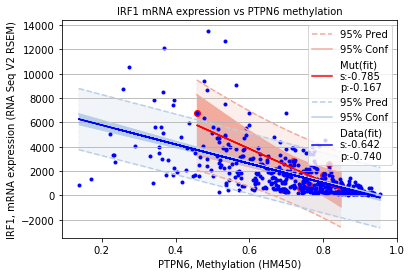

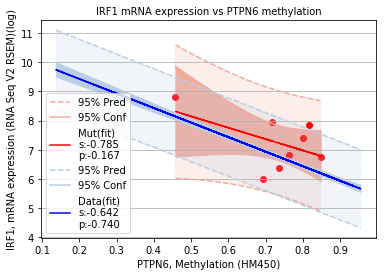

In [196]:
CIReadPlot('./plots-irf1-ptpn6.txt', 'IRF1 mRNA expression vs PTPN6 methylation')

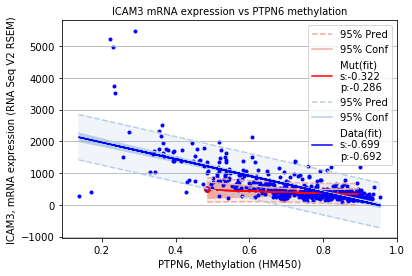

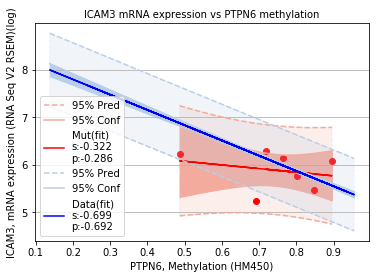

In [197]:
CIReadPlot('./plots-icam3-ptpn6.txt', 'ICAM3 mRNA expression vs PTPN6 methylation')

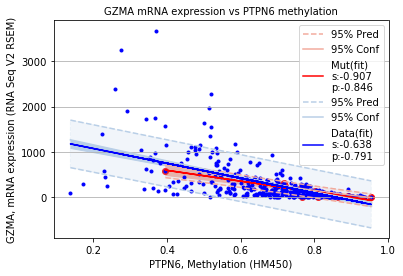

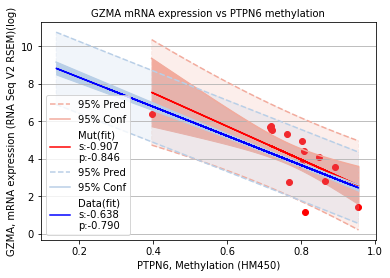

In [198]:
CIReadPlot('./plots-gzma-ptpn6.txt', 'GZMA mRNA expression vs PTPN6 methylation')

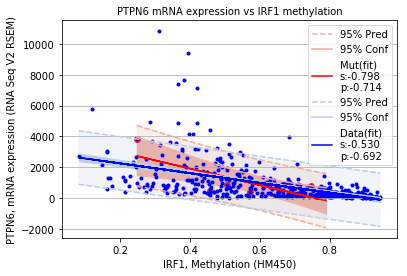

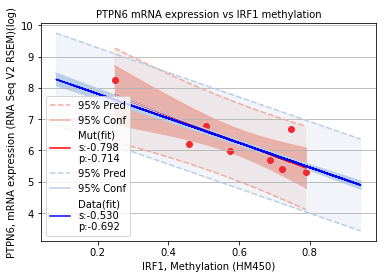

In [200]:
CIReadPlot('./plots-ptpn6-irf1.txt', 'PTPN6 mRNA expression vs IRF1 methylation')

## Single-gene-methylation-mRNA-expression Correlation
mRNA expression which shows significant correlation (Pearson, Spearman) i.e. > 0.5 or < -0.5

In [173]:
sgdf = pd.read_csv('./sgmm.csv', sep='\t')
sgdf = sgdf.sort_values(['Spearman', 'Pearson'], ascending=[True, True])
sgdf_both = sgdf['Pearson'].lt(-0.5) & sgdf['Spearman'].lt(-0.5)

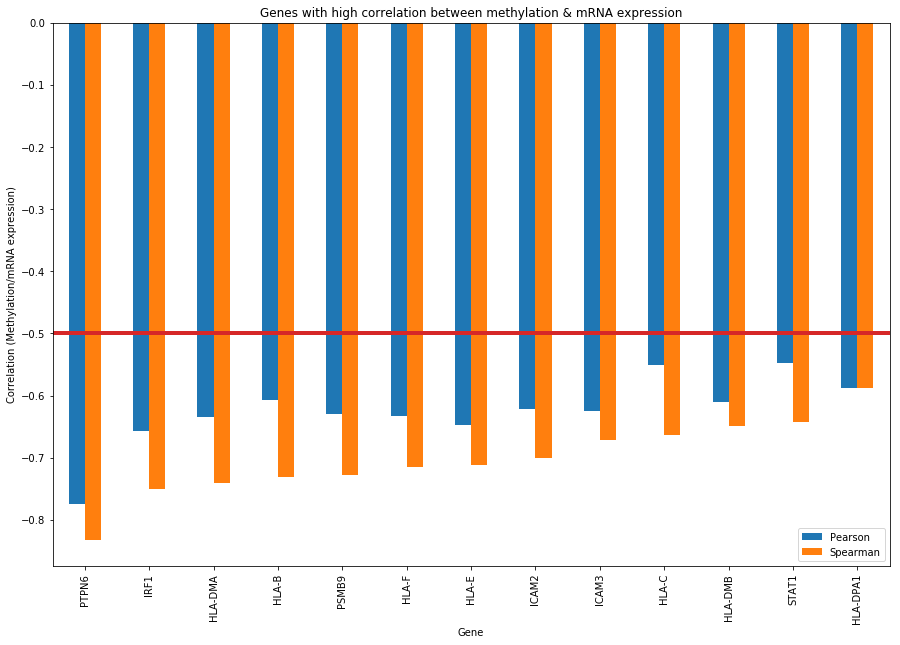

In [174]:
plt.figure()
ax = sgdf[sgdf_both].plot.bar(x='Gene', figsize=(15,10))
plt.axhline(y=-0.5, linewidth=4, color='#d62728')
ax.set_ylabel('Correlation (Methylation/mRNA expression)')
ax.set_title('Genes with high correlation between methylation & mRNA expression')
plt.show()

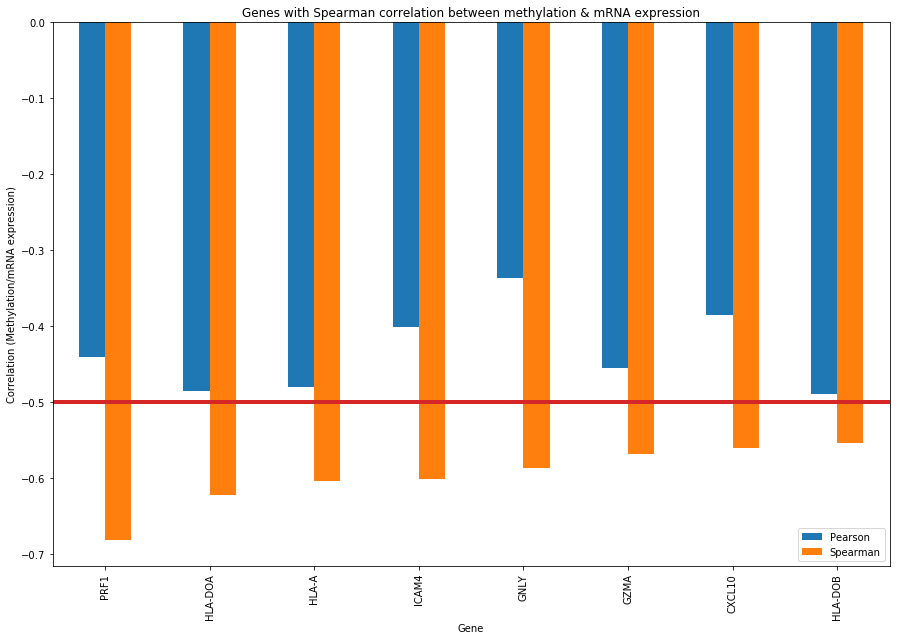

In [175]:
plt.figure()
ax = sgdf[~sgdf_both].plot.bar(x='Gene', figsize=(15,10))
plt.axhline(y=-0.5, linewidth=4, color='#d62728')
ax.set_ylabel('Correlation (Methylation/mRNA expression)')
ax.set_title('Genes with Spearman correlation between methylation & mRNA expression')
plt.show()

# Pair-genes- coexpression-mRNA (PGCM)
mRNA expression of 2 genes (A & B) which show significant correlation (Pearson and Spearman) i.e. > 0.5 or < -0.5. For this pair, see if methylation of either gene (A or B) shows significant correlation with the mRNA expression

In [181]:
mutex = pd.read_csv('./mutex_meth.csv', sep='\t')

In [182]:
mutex.head()

,Gene A,Gene B,p-Value,Log Odds Ratio,Association,Methylation (Pearson & Spearman both),Methylation (Spearman only)
0,IFNG,IRF1,<0.001,>3,Co-occurence,IRF1,None
1,IFNG,STAT1,<0.001,2.744,Co-occurence,None,None
2,IRF1,STAT1,<0.001,>3,Co-occurence,IRF1,STAT1
3,IFNG,PSMB9,<0.001,1.839,Co-occurence,PSMB9,None
4,IRF1,PSMB9,<0.001,2.323,Co-occurence,PSMB9 IRF1,None


In [183]:
mutex.shape

(187, 7)

## Find and remove rows where methylation of either gene does not affect co-expression of other gene
i.e. remove rows where methylation (Pearson & Spearman) and (Spearman only) have "None" values

In [185]:
no_meth_spearman_pearson = mutex['Methylation (Pearson & Spearman both)'].str.contains('None')
no_meth_spearman_only = mutex['Methylation (Spearman only)'].str.contains('None')
no_meth = no_meth_spearman_pearson & no_meth_spearman_only

In [186]:
meth_mutex = mutex[~no_meth]
meth_mutex

,Gene A,Gene B,p-Value,Log Odds Ratio,Association,Methylation (Pearson & Spearman both),Methylation (Spearman only)
0,IFNG,IRF1,<0.001,>3,Co-occurence,IRF1,None
2,IRF1,STAT1,<0.001,>3,Co-occurence,IRF1,STAT1
3,IFNG,PSMB9,<0.001,1.839,Co-occurence,PSMB9,None
4,IRF1,PSMB9,<0.001,2.323,Co-occurence,PSMB9 IRF1,None
5,STAT1,PSMB9,<0.001,2.304,Co-occurence,PSMB9,STAT1
13,ICAM2,ICAM3,<0.001,>3,Co-occurence,ICAM2 ICAM3,None
18,ICAM3,VCAM1,0.009,1.899,Co-occurence,None,ICAM3
20,IRF1,CCR5,<0.001,>3,Co-occurence,IRF1,None
22,PSMB9,CCR5,0.001,1.61,Co-occurence,PSMB9,None
24,ICAM3,CCR5,0.031,1.707,Co-occurence,ICAM3,None


In [187]:
uniq = mutex['Gene A'].append(mutex['Gene B']).drop_duplicates()
uniq.head()

0       IFNG
2       IRF1
5      STAT1
9     IFNGR1
12     ICAM1
dtype: object

In [188]:
uniq.shape

(37,)

In [189]:
df_count = uniq.to_frame(name='Gene')

## For each methylated gene, count other genes whose mRNA expression is correlated to methylated gene
MethBothCount: Count of genes whose mRNA expression correlates both with Pearson & Spearman coefficients
MethOneCount: Count of genes whose mRNA expression correlates only with Spearman coefficient

In [190]:
def count_fn(gene, mutex):
    return mutex.str.contains(gene).sum()

df_count['MethBothCount'] = df_count.apply(lambda row: count_fn(row['Gene'], 
                                                                mutex['Methylation (Pearson & Spearman both)']), axis=1)
df_count['MethOneCount'] = df_count.apply(lambda row: count_fn(row['Gene'], 
                                                                mutex['Methylation (Spearman only)']), axis=1)
coexA = df_count.apply(lambda row: count_fn(row['Gene'], mutex['Gene A']), axis=1)
coexB = df_count.apply(lambda row: count_fn(row['Gene'], mutex['Gene B']), axis=1)
df_count['CoexCount'] = coexA + coexB
df_count['MethCoex%'] = 100*((df_count['MethBothCount'] + df_count['MethOneCount'])/df_count['CoexCount'])

## Sort genes based on methylation affecting coexpression
1. Overall percentage of Coexpression affected by methylation
2. Higher weightage when methylation is high(both Spearman and Pearson correlation > 0.5 or < -0.5)
3. Next weightage for medium methylation (only Spearman correlation > 0.5 or < -0.5) 

In [191]:
df_count

,Gene,MethBothCount,MethOneCount,CoexCount,MethCoex%
0,IFNG,0,0,22,0.000000
2,IRF1,10,5,16,93.750000
5,STAT1,0,5,15,33.333333
9,IFNGR1,0,0,3,0.000000
12,ICAM1,0,0,17,0.000000
13,ICAM2,5,1,7,85.714286
14,ICAM3,6,3,13,69.230769
15,ICAM4,0,0,2,0.000000
22,PSMB9,9,6,15,100.000000
25,VCAM1,0,0,12,0.000000


In [192]:
df_count = df_count.sort_values(['MethBothCount', 'MethOneCount', 'MethCoex%'],
                                ascending=[False, False, False])

## Print genes whose expression is affected by this gene's methylation

In [193]:
def coex_str(gene, mutex, col):
    g1 = mutex[col].str.contains(gene)
    g1 = mutex[g1]
    coex = g1['Gene A'].append(g1['Gene B']).drop_duplicates()
    coex = coex[~coex.str.contains(gene)]
    return coex.str.cat(sep=' ')

df_count['Coex'] = df_count.apply(lambda row: coex_str(row['Gene'], mutex, 
                                                       'Methylation (Pearson & Spearman both)'), axis=1)
df_count['CoexSpearman'] = df_count.apply(lambda row: coex_str(row['Gene'], mutex, 
                                                       'Methylation (Spearman only)'), axis=1)
df_count

,Gene,MethBothCount,MethOneCount,CoexCount,MethCoex%,Coex,CoexSpearman
172,PTPN6,13,2,17,88.235294,ICAM3 ICAM2 GZMA CCR5 GZMB IFNG PRF1 IRF1 CXCL...,CXCL10 CXCL11
2,IRF1,10,5,16,93.750000,IFNG STAT1 PSMB9 CCR5 CCL4 CCL5 CXCL9 CXCL10 G...,CCL3 CXCL11 GZMB PRF1 GNLY
22,PSMB9,9,6,15,100.000000,IFNG IRF1 STAT1 CCR5 CCL4 CXCL9 CXCL10 GZMA HLA-C,CCL3 CCL5 CXCL11 GZMB PRF1 GNLY
14,ICAM3,6,3,13,69.230769,ICAM2 CCR5 CCL5 GZMA HLA-DMA PTPN6,VCAM1 CCL3 PRF1
136,PRF1,5,12,18,94.444444,IRF1 PSMB9 CCL4 HLA-DRA PTPN6,IFNG STAT1 ICAM3 CCR5 CCL3 CCL5 CXCL9 CXCL10 C...
13,ICAM2,5,1,7,85.714286,ICAM3 CCL5 GZMA HLA-DMA PTPN6,GZMB
110,GZMA,1,11,19,63.157895,PTPN6,IFNG IRF1 PSMB9 CCR5 CCL4 CCL5 CXCL9 GZMB PRF1...
153,HLA-G,1,6,8,87.500000,HLA-B,IFNG CCR5 GZMB HLA-DMA HLA-DRA PTPN6
138,HLA-C,1,0,1,100.000000,PSMB9,
145,HLA-B,1,0,2,50.000000,HLA-DRA,


## Plot genes whose methylation affects coexpression of other genes

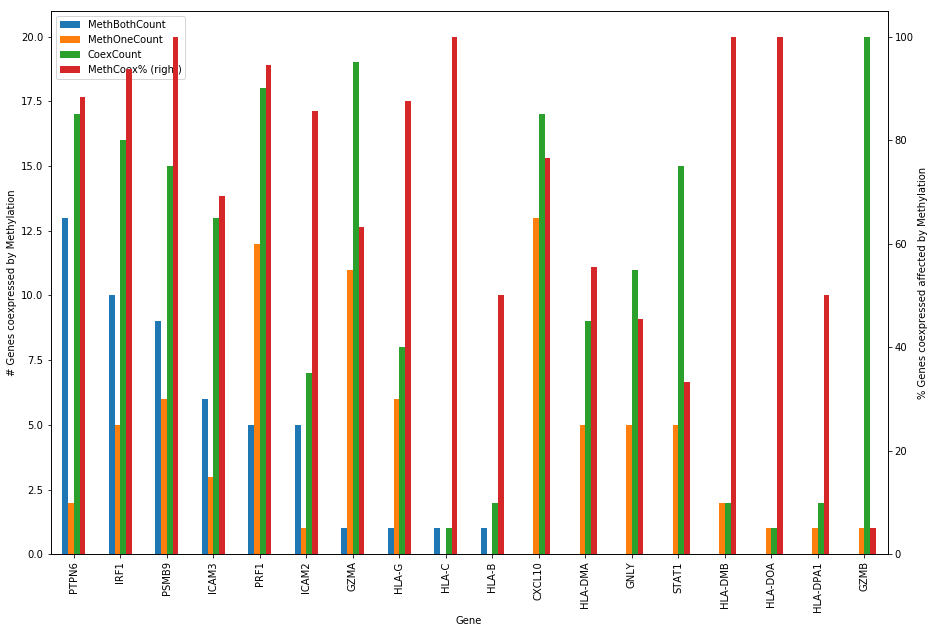

In [194]:
df2 = df_count['MethCoex%'].eq(0)
plt.figure()
ax = df_count[~df2].plot.bar(x='Gene', secondary_y=['MethCoex%'], figsize=(15,10))
ax.set_ylabel('# Genes coexpressed by Methylation')
ax.right_ax.set_ylabel('% Genes coexpressed affected by Methylation')
plt.show()

## Plot only genes where methylation does not affect coexpression

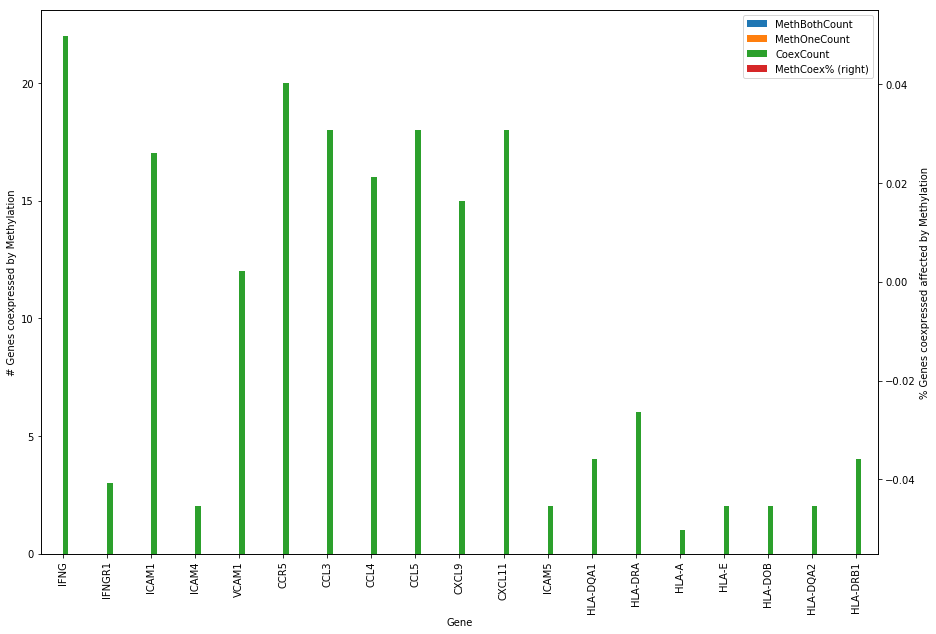

In [195]:
df2 = df_count['MethCoex%'].eq(0)
plt.figure()
ax = df_count[df2].plot.bar(x='Gene', secondary_y=['MethCoex%'], figsize=(15,10))
ax.set_ylabel('# Genes coexpressed by Methylation')
ax.right_ax.set_ylabel('% Genes coexpressed affected by Methylation')
plt.show()

### Exploratory chart/models for finding prediction/range